# Predicting BTC/USDT Short-Term Volatility

**CIS 5450 Final Project**

We predict the realized volatility of Bitcoin over the next 10 minutes from 1-minute OHLCV candles. Volatility is the *amplitude* of price movement, not direction, which drives option prices, risk budgets, and stop-loss sizing, so forecasting it matters directly for options desks, risk managers, and market makers.

**Target.**  $\text{RV}_t = \text{std}(r_{t+1}, \ldots, r_{t+10})$ where $r_t = \ln(P_t / P_{t-1})$.

**Dataset.**  One year of 1-minute BTC/USDT candles from Binance's public data archive (2024-04-01 to 2025-03-31), about 525K rows. No API key required.

**Roadmap.**
1. Download and clean the data (regex validation, gap handling)
2. Store in DuckDB for SQL queries and show a Polars groupby for variety
3. Engineer ~45 lookahead-safe features and compute the target
4. EDA to motivate the feature and model choices
5. Fit four models: Persistence baseline, GARCH(1,1), Lasso, XGBoost
6. Compare with six metrics and Moving Block Bootstrap hypothesis tests
7. Interpret which features drove predictions and discuss for stakeholders

## 1. Setup

In [1]:
import io
import re
import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
import polars as pl
import duckdb
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from scipy import stats
from tqdm import tqdm

plt.style.use("seaborn-v0_8-whitegrid")
sns.set_palette("deep")
pd.set_option("display.max_columns", 60)
np.random.seed(42)

In [2]:
# paths
PROJECT_ROOT = Path.cwd()
DATA_RAW = PROJECT_ROOT / "data" / "raw"
DATA_PROCESSED = PROJECT_ROOT / "data" / "processed"
DUCKDB_PATH = DATA_PROCESSED / "crypto_volatility.duckdb"
OUTPUT_FIGURES = PROJECT_ROOT / "outputs" / "figures"
OUTPUT_TABLES = PROJECT_ROOT / "outputs" / "tables"
for d in (DATA_RAW, DATA_PROCESSED, OUTPUT_FIGURES, OUTPUT_TABLES):
    d.mkdir(parents=True, exist_ok=True)

# data source
SYMBOL   = "BTCUSDT"
INTERVAL = "1m"
START    = "2024-04-01"
END      = "2025-03-31"

# feature engineering
TARGET_WINDOW    = 10
ROLLING_WINDOWS  = [5, 10, 30, 60]
LAG_STEPS        = list(range(1, 11))
ATR_PERIOD       = 14
BOLLINGER_PERIOD = 20

# chronological split
TRAIN_RATIO = 0.85
VAL_RATIO   = 0.05

# regex
RE_TIMESTAMP_MS = r"^\d{13,16}$"
RE_TRADING_PAIR = r"^([A-Z]{2,10})(USDT|BTC|ETH)$"
RE_NUMERIC      = r"^-?\d+\.?\d*$"

SEED = 42

## 2. Download 1-Minute Candles from Binance

The URL pattern is `https://data.binance.vision/data/spot/daily/klines/{symbol}/{interval}/{symbol}-{interval}-{date}.zip`. Each ZIP is a headerless CSV with 12 columns. We cache the raw parquet so we never need to re-download.

In [3]:
KLINE_COLS = [
    "open_time", "open", "high", "low", "close", "volume",
    "close_time", "quote_volume", "num_trades",
    "taker_buy_base_volume", "taker_buy_quote_volume", "ignore",
]

def fetch_klines(symbol=SYMBOL, interval=INTERVAL, start=START, end=END):
    dates = pd.date_range(pd.Timestamp(start), pd.Timestamp(end), freq="D")
    frames, failed = [], []
    for d in tqdm(dates, desc="downloading"):
        ds = d.strftime("%Y-%m-%d")
        url = (f"https://data.binance.vision/data/spot/daily/klines/"
               f"{symbol}/{interval}/{symbol}-{interval}-{ds}.zip")
        try:
            r = requests.get(url, timeout=30)
            if r.status_code != 200:
                failed.append(ds); continue
            with zipfile.ZipFile(io.BytesIO(r.content)) as zf:
                with zf.open(zf.namelist()[0]) as f:
                    frames.append(pd.read_csv(f, header=None, names=KLINE_COLS))
        except Exception:
            failed.append(ds)
    if not frames:
        raise RuntimeError("nothing downloaded")
    df = pd.concat(frames, ignore_index=True)
    print(f"downloaded {len(df):,} candles, {len(failed)} days failed")
    return df

raw_path = DATA_RAW / f"{SYMBOL.lower()}_{INTERVAL}_raw.parquet"
if raw_path.exists():
    raw_df = pd.read_parquet(raw_path)
    print(f"loaded cached raw data: {len(raw_df):,} rows")
else:
    raw_df = fetch_klines()
    raw_df.to_parquet(raw_path, index=False)
raw_df.head()

downloading: 100%|██████████| 365/365 [03:32<00:00,  1.72it/s]


downloaded 525,600 candles, 0 days failed


,open_time,open,high,low,close,volume,close_time,quote_volume,num_trades,taker_buy_base_volume,taker_buy_quote_volume,ignore
0,1711929600000,71280.00,71288.23,71180.00,71186.00,79.69747,1711929659999,5.676308e+06,2505,30.69658,2.186056e+06,0
1,1711929660000,71186.01,71255.93,71172.09,71220.01,26.45610,1711929719999,1.883926e+06,1561,18.04325,1.284849e+06,0
2,1711929720000,71220.01,71220.01,71130.00,71155.92,50.57502,1711929779999,3.599674e+06,1875,27.90212,1.985873e+06,0
3,1711929780000,71155.92,71223.08,71107.71,71223.07,57.85907,1711929839999,4.116186e+06,2404,37.36552,2.658345e+06,0
4,1711929840000,71223.07,71249.57,71215.95,71233.42,18.37316,1711929899999,1.308760e+06,1080,8.72089,6.211873e+05,0


## 3. Clean the Data

Raw data can contain several issues, and we want to check on the main ones below:
- Mixed timestamp precision (some rows in ms, some in µs)
- Non-numeric junk in price columns (e.g. "N/A")
- Duplicate minutes
- Missing minutes (exchange downtime)


In [4]:
# examine data types
print('dtypes:')
print(raw_df.dtypes)
print()

# 1. check duplicate timestamps
dups = raw_df['open_time'].duplicated().sum()
print(f'duplicate open_time values: {dups}')

# 2. check mixed timestamp precision (13-digit ms vs 16-digit us)
ts_int = raw_df['open_time'].astype(np.int64)
print(f'ms-precision timestamps (< 1e15): {(ts_int <  1e15).sum():,}')
print(f'us-precision timestamps (>=1e15): {(ts_int >= 1e15).sum():,}')

# 3. check non-numeric junk in price/volume columns
pattern = re.compile(RE_NUMERIC)
non_numeric = 0
for c in ['open', 'high', 'low', 'close', 'volume']:
    non_numeric += (~raw_df[c].astype(str).apply(lambda x: bool(pattern.fullmatch(x)))).sum()
print(f'non-numeric cells across OHLCV columns: {non_numeric}')

# 4. check missing minutes (gap > 60,000 ms between consecutive timestamps)
diffs = ts_int.sort_values().diff().dropna()
gaps = diffs[diffs > 60_000]
print(f'minute gaps (> 1 min between rows): {len(gaps)}')
if len(gaps):
    print(f'largest gap: {gaps.max()/1000/60:.1f} minutes')

raw_df.head()

dtypes:
open_time                   int64
open                      float64
high                      float64
low                       float64
close                     float64
volume                    float64
close_time                  int64
quote_volume              float64
num_trades                  int64
taker_buy_base_volume     float64
taker_buy_quote_volume    float64
ignore                      int64
dtype: object

duplicate open_time values: 0
ms-precision timestamps (< 1e15): 396,000
us-precision timestamps (>=1e15): 129,600
non-numeric cells across OHLCV columns: 0
minute gaps (> 1 min between rows): 129600
largest gap: 28899231841.0 minutes


,open_time,open,high,low,close,volume,close_time,quote_volume,num_trades,taker_buy_base_volume,taker_buy_quote_volume,ignore
0,1711929600000,71280.00,71288.23,71180.00,71186.00,79.69747,1711929659999,5.676308e+06,2505,30.69658,2.186056e+06,0
1,1711929660000,71186.01,71255.93,71172.09,71220.01,26.45610,1711929719999,1.883926e+06,1561,18.04325,1.284849e+06,0
2,1711929720000,71220.01,71220.01,71130.00,71155.92,50.57502,1711929779999,3.599674e+06,1875,27.90212,1.985873e+06,0
3,1711929780000,71155.92,71223.08,71107.71,71223.07,57.85907,1711929839999,4.116186e+06,2404,37.36552,2.658345e+06,0
4,1711929840000,71223.07,71249.57,71215.95,71233.42,18.37316,1711929899999,1.308760e+06,1080,8.72089,6.211873e+05,0


In [5]:
def validate_timestamps(s):
    pattern = re.compile(RE_TIMESTAMP_MS)
    return s.astype(str).apply(lambda x: bool(pattern.fullmatch(x)))

def validate_numeric(df, cols):
    pattern = re.compile(RE_NUMERIC)
    bad = pd.Series(False, index=df.index)
    for c in cols:
        bad |= ~df[c].astype(str).apply(lambda x: bool(pattern.fullmatch(x)))
    if bad.any():
        print(f"dropping {bad.sum()} rows with non-numeric values")
    df = df.loc[~bad].copy()
    for c in cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    return df

def clean_data(df):
    df = df.copy()

    mask = validate_timestamps(df["open_time"])
    if not mask.all():
        print(f"dropping {(~mask).sum()} invalid timestamp rows")
        df = df.loc[mask]

    num_cols = ["open", "high", "low", "close", "volume",
                "quote_volume", "taker_buy_base_volume", "taker_buy_quote_volume"]
    df = validate_numeric(df, num_cols)

    df["open_time"]  = pd.to_numeric(df["open_time"])
    df["num_trades"] = pd.to_numeric(df["num_trades"]).astype(int)
    for c in num_cols:
        df[c] = df[c].astype(float)

    # normalize µs to ms, then to UTC
    ts = df["open_time"].astype(np.int64)
    ts_ms = ts.where(ts < 1e15, ts // 1000)
    df["timestamp"] = pd.to_datetime(ts_ms, unit="ms", utc=True)
    df = df.set_index("timestamp").sort_index()
    df = df[~df.index.duplicated(keep="first")]
    df = df.drop(columns=["open_time", "close_time", "ignore"], errors="ignore")

    # reindex to full minute grid and handle gaps
    full = pd.date_range(df.index.min(), df.index.max(), freq="1min", tz="UTC")
    df = df.reindex(full); df.index.name = "timestamp"
    was_nan = df["close"].isna()
    gap_size = was_nan.groupby(was_nan.ne(was_nan.shift()).cumsum()).transform("sum")
    big_gaps = was_nan & (gap_size > 2)
    if big_gaps.any():
        print(f"{big_gaps.sum()} rows in gaps > 2 min will be dropped after ffill")
    df = df.ffill().dropna(subset=["close"])

    # regex on the symbol itself just to show how capture groups work
    pair = re.match(RE_TRADING_PAIR, SYMBOL)
    print(f"trading pair: {pair.group(1)}/{pair.group(2)}")
    print(f"cleaned rows: {len(df):,}")
    print(f"range: {df.index.min()} to {df.index.max()}")
    return df

clean_df = clean_data(raw_df)
clean_df.to_parquet(DATA_PROCESSED / f"{SYMBOL.lower()}_1m_clean.parquet")
clean_df.head()

trading pair: BTC/USDT
cleaned rows: 525,600
range: 2024-04-01 00:00:00+00:00 to 2025-03-31 23:59:00+00:00


,open,high,low,close,volume,quote_volume,num_trades,taker_buy_base_volume,taker_buy_quote_volume
timestamp,,,,,,,,,
2024-04-01 00:00:00+00:00,71280.00,71288.23,71180.00,71186.00,79.69747,5.676308e+06,2505,30.69658,2.186056e+06
2024-04-01 00:01:00+00:00,71186.01,71255.93,71172.09,71220.01,26.45610,1.883926e+06,1561,18.04325,1.284849e+06
2024-04-01 00:02:00+00:00,71220.01,71220.01,71130.00,71155.92,50.57502,3.599674e+06,1875,27.90212,1.985873e+06
2024-04-01 00:03:00+00:00,71155.92,71223.08,71107.71,71223.07,57.85907,4.116186e+06,2404,37.36552,2.658345e+06
2024-04-01 00:04:00+00:00,71223.07,71249.57,71215.95,71233.42,18.37316,1.308760e+06,1080,8.72089,6.211873e+05


**Analysis and Motivation for Next Steps:**

In this dataset, we found that the main issue was mixed timestamp precision: 396,000 rows used millisecond timestamps while 129,600 rows used microsecond timestamps. We found no duplicate open_time values and no non-numeric OHLCV cells. After normalizing all timestamps to milliseconds and reindexing to a complete 1-minute UTC grid, the cleaned dataset contains 525,600 rows from 2024-04-01 00:00 to 2025-03-31 23:59, which matches the expected number of minutes in the one-year sample.

This cleaning step gives us a continuous, numeric, minute-level time series, which is necessary before computing rolling volatility features and forward-looking realized volatility targets.

## 4. Store in DuckDB + Polars Groupby Demo

Two tables: `raw_candles` (one row per minute) and `predictions` (one row per model × minute). We use DuckDB SQL for aggregations and JOINs, and show a quick Polars groupby as well.

**Motivation:**

After cleaning the raw candles, we store them in a structured DuckDB database so the rest of the pipeline has a stable source of truth. This matters because later steps require repeated time-window aggregations, joins between actual and predicted volatility, and reproducible model evaluation. DuckDB gives us SQL-style querying over local data without needing a separate database server, while Polars provides a fast dataframe interface for groupby-style summaries.

In [6]:
conn = duckdb.connect(str(DUCKDB_PATH))

conn.execute("""
    CREATE TABLE IF NOT EXISTS raw_candles (
        timestamp TIMESTAMP WITH TIME ZONE PRIMARY KEY,
        open DOUBLE, high DOUBLE, low DOUBLE, close DOUBLE,
        volume DOUBLE, quote_volume DOUBLE, num_trades INTEGER,
        taker_buy_base_volume DOUBLE, taker_buy_quote_volume DOUBLE
    )
""")
conn.execute("""
    CREATE TABLE IF NOT EXISTS predictions (
        timestamp TIMESTAMP WITH TIME ZONE,
        model_name VARCHAR,
        predicted_vol DOUBLE,
        actual_vol DOUBLE,
        PRIMARY KEY (timestamp, model_name)
    )
""")

insert_df = clean_df.reset_index()[[
    "timestamp", "open", "high", "low", "close", "volume",
    "quote_volume", "num_trades", "taker_buy_base_volume", "taker_buy_quote_volume",
]]
conn.execute("DELETE FROM raw_candles")
conn.execute("INSERT INTO raw_candles SELECT * FROM insert_df")
print("rows in raw_candles:", conn.execute("SELECT COUNT(*) FROM raw_candles").fetchone()[0])

rows in raw_candles: 525600


In [7]:
# SQL GROUP BY: resample 1-min to 5-min candles
resampled = conn.execute("""
    SELECT
        time_bucket(INTERVAL '5 minutes', timestamp) AS bucket,
        FIRST(open ORDER BY timestamp) AS open,
        MAX(high)  AS high,
        MIN(low)   AS low,
        LAST(close ORDER BY timestamp) AS close,
        SUM(volume)      AS volume,
        SUM(num_trades)  AS num_trades
    FROM raw_candles
    GROUP BY bucket
    ORDER BY bucket
    LIMIT 5
""").fetchdf()
resampled

,bucket,open,high,low,close,volume,num_trades
0,2024-04-01 00:00:00+00:00,71280.00,71288.23,71107.71,71233.42,232.96082,9425.0
1,2024-04-01 00:05:00+00:00,71233.42,71236.50,71115.73,71193.99,88.08060,5996.0
2,2024-04-01 00:10:00+00:00,71194.00,71194.00,71124.00,71140.01,56.59844,3796.0
3,2024-04-01 00:15:00+00:00,71140.00,71184.30,71102.00,71184.29,77.65464,6207.0
4,2024-04-01 00:20:00+00:00,71184.30,71184.30,71152.49,71181.21,79.81845,4399.0


The 5-minute resample verifies that the table supports standard financial candle aggregation: the open is the first price in the bucket, the high and low are extrema, the close is the last price, and volume/trades are additive.

In [8]:
# same kind of aggregation in Polars just to compare
pl_df = pl.read_parquet(DATA_PROCESSED / f"{SYMBOL.lower()}_1m_clean.parquet")
daily = (
    pl_df
    .with_columns(pl.col("timestamp").dt.date().alias("date"))
    .group_by("date")
    .agg([
        pl.col("volume").sum().alias("total_volume"),
        pl.col("close").std().alias("close_std"),
        pl.col("num_trades").sum().alias("total_trades"),
    ])
    .sort("date")
)
daily.head()

date,total_volume,close_std,total_trades
date,f64,f64,i64
2024-04-01,41445.32039,729.104008,1893438
2024-04-02,71799.82793,1166.744135,2662410
2024-04-03,39887.21778,325.019522,2172096
2024-04-04,41510.48453,1065.412986,2000945
2024-04-05,37915.23073,520.616118,1901980


The Polars daily aggregation is not used as a model input here; it is included to demonstrate a second dataframe engine and to quickly sanity-check daily trading activity and price variation.

### Schema (ER-style) and 3NF

```
raw_candles                             predictions
-----------                             -----------
timestamp (PK)  <---+                   timestamp   (PK part 1) ---+
open                 \                  model_name  (PK part 2)    |
high                  \                 predicted_vol              |
low                    +--- join on --- actual_vol                 |
close                     timestamp                                |
volume                                                             |
...                                                                |
```

For this analytics pipeline, the schema is normalized around the entities we need most: cleaned candles and model predictions. The `raw_candles` table is keyed by `timestamp`, so each minute has one OHLCV record. The `predictions` table is keyed by (`timestamp`, `model_name`), so each model has at most one forecast per minute. We intentionally store `actual_vol` alongside each prediction to simplify later metric calculations, although a fully normalized design could place actual volatility in a separate target table.

## 5. Converting Candle Data into Quantitative Forecasting Signals

This section turns the cleaned 1-minute candle data into a supervised learning table. Each row represents one minute. The input features summarize what the market looked like up to that minute, and the label is the realized volatility over the **next 10 minutes**. In other words, we are asking: given recent price movement, trading range, volume, and time-of-day information, can we forecast how volatile BTC will be in the near future?

The raw candles contain only basic market data: open, high, low, close, volume, trade count, taker-buy volume, and timestamp. Feature engineering converts those raw columns into standard quantitative-finance signals that are more directly related to volatility. These are not hand-picked individual variables; they are feature families commonly used in volatility modeling, technical analysis, and market microstructure.

A key rule is that every predictive feature is shifted by one minute using `.shift(1)`. This means that at time *t*, the model only sees information available through *t−1*. This avoids lookahead bias: if a feature accidentally uses the current or future candle, the backtest may look unrealistically good but fail in real deployment.

We build several feature families:

- **Returns**: log returns and lagged returns from the past 1–10 minutes. Returns are more stationary than raw prices and capture recent price shocks.
- **Range-based volatility**: Parkinson and Garman-Klass estimators over 5/10/30/60-minute windows. These use the high-low or open-high-low-close structure of candles, so they capture intraperiod movement that close-to-close returns miss.
- **Technical volatility indicators**: ATR and Bollinger width. These are common trading indicators that summarize recent trading range and price dispersion.
- **Volume features**: volume ratios over 10/30/60-minute windows and z-scored OBV. Volume often rises when information enters the market, so it can help predict future volatility.
- **Order-flow proxy**: taker-buy volume divided by total volume. This approximates buy-side pressure and helps capture imbalance in aggressive trading.
- **Rolling return statistics**: mean, standard deviation, max, min, skew, and kurtosis over 5/10/30/60-minute windows. These summarize the recent distribution of returns, including volatility, extremes, and asymmetry.
- **Time-of-day features**: sine and cosine of hour. Crypto trades 24/7, but market activity still varies across global trading sessions; cyclical encoding also makes 23:59 and 00:00 close together numerically.

After building these features, we let Lasso and XGBoost decide which ones are useful. Lasso can shrink weak or redundant features toward zero, while XGBoost can capture nonlinear relationships and interactions. This lets us start from broad, theory-motivated feature families without pretending we know in advance which exact variable will matter most.

**Research for Quantative Signals & Acknowledgments:**
Range-based volatility features are motivated by Parkinson’s high-low estimator, which showed that extreme values such as high and low prices contain useful information for estimating return variance. Garman-Klass extends this idea by using open, high, low, and close prices and is often discussed as more efficient than simple close-to-close volatility estimators. Recent-volatility windows are also consistent with HAR-style realized volatility models, which forecast volatility using components from multiple time horizons. Volume and time-of-day features are included because empirical market microstructure research documents volume-volatility relationships and intraday periodicity in high-frequency volatility.

**Example of Engineered Features & Reasoning:**

The table below shows representative examples of the feature families; the code expands several of these families across multiple rolling windows or lags:

| Raw candle input | Engineered feature examples | Why it may help predict volatility |
|---|---|---|
| close | log returns, return lags | Recent price shocks often persist through volatility clustering |
| high, low | Parkinson volatility | High-low range captures intraminute movement |
| open, high, low, close | Garman-Klass volatility | Uses the full candle shape, not just closing prices |
| high, low, close | ATR | Measures recent trading range |
| close | Bollinger width, rolling return stats | Captures recent dispersion and momentum/mean-reversion context |
| volume | volume ratios, OBV | Heavy trading activity often coincides with larger future moves |
| taker-buy volume | taker ratio | Proxy for aggressive buy-side order flow |
| timestamp | hour sin/cos | Captures recurring intraday liquidity/activity cycles |

In [11]:
def log_returns(close):
    return np.log(close).diff()

def parkinson_vol(high, low, w):
    hl2 = np.log(high / low) ** 2
    return np.sqrt(hl2.rolling(w).mean() / (4 * np.log(2))).shift(1)

def garman_klass_vol(open_, high, low, close, w):
    hl = np.log(high / low)
    co = np.log(close / open_)
    gk = 0.5 * hl**2 - (2*np.log(2) - 1) * co**2
    return np.sqrt(gk.rolling(w).mean().clip(lower=0)).shift(1)

def atr(high, low, close, period=ATR_PERIOD):
    prev = close.shift(1)
    tr = pd.concat([high - low, (high - prev).abs(), (low - prev).abs()], axis=1).max(axis=1)
    return tr.ewm(span=period, adjust=False).mean().shift(1)

def bollinger_width(close, period=BOLLINGER_PERIOD, k=2):
    sma = close.rolling(period).mean()
    std = close.rolling(period).std()
    return ((sma + k*std - (sma - k*std)) / sma).shift(1)

def volume_ratio(volume, w):
    return (volume / volume.rolling(w).mean()).shift(1)

def obv(close, volume):
    direction = np.sign(close.diff()); direction.iloc[0] = 0
    raw = (direction * volume).cumsum()
    z = (raw - raw.rolling(60, min_periods=1).mean()) / (raw.rolling(60, min_periods=1).std() + 1e-10)
    return z.shift(1)

def taker_ratio(taker, total):
    return (taker / (total + 1e-10)).shift(1)

def rolling_stats(returns, windows=ROLLING_WINDOWS):
    frames = {}
    for w in windows:
        r = returns.rolling(w)
        frames[f"ret_mean_{w}"] = r.mean().shift(1)
        frames[f"ret_std_{w}"]  = r.std().shift(1)
        frames[f"ret_max_{w}"]  = r.max().shift(1)
        frames[f"ret_min_{w}"]  = r.min().shift(1)
        frames[f"ret_skew_{w}"] = r.skew().shift(1)
        frames[f"ret_kurt_{w}"] = r.kurt().shift(1)
    return pd.DataFrame(frames, index=returns.index)

def lag_features(returns, lags=LAG_STEPS):
    return pd.DataFrame({f"lag_{lag}": returns.shift(lag) for lag in lags}, index=returns.index)

In [12]:
def build_features(df):
    feats = pd.DataFrame(index=df.index)
    rets = log_returns(df["close"])
    feats["log_return"] = rets.shift(1)

    for w in ROLLING_WINDOWS:
        feats[f"parkinson_{w}"]    = parkinson_vol(df["high"], df["low"], w)
        feats[f"garman_klass_{w}"] = garman_klass_vol(df["open"], df["high"], df["low"], df["close"], w)

    feats["atr"] = atr(df["high"], df["low"], df["close"])
    feats["bollinger_width"] = bollinger_width(df["close"])

    for w in [10, 30, 60]:
        feats[f"volume_ratio_{w}"] = volume_ratio(df["volume"], w)
    feats["obv"] = obv(df["close"], df["volume"])

    if "taker_buy_base_volume" in df.columns:
        feats["taker_ratio"] = taker_ratio(df["taker_buy_base_volume"], df["volume"])

    feats = pd.concat([feats, rolling_stats(rets), lag_features(rets)], axis=1)

    # cyclical encoding of hour of day
    hour = df.index.hour + df.index.minute / 60.0
    feats["hour_sin"] = np.sin(2*np.pi*hour/24)
    feats["hour_cos"] = np.cos(2*np.pi*hour/24)

    before = len(feats)
    feats = feats.dropna()
    print(f"features: {feats.shape}, dropped {before - len(feats)} warmup rows")
    return feats

features = build_features(clean_df)
features.head()

features: (525203, 52), dropped 397 warmup rows


,log_return,parkinson_5,garman_klass_5,parkinson_10,garman_klass_10,parkinson_30,garman_klass_30,parkinson_60,garman_klass_60,atr,bollinger_width,volume_ratio_10,volume_ratio_30,volume_ratio_60,obv,taker_ratio,ret_mean_5,ret_std_5,ret_max_5,ret_min_5,ret_skew_5,ret_kurt_5,ret_mean_10,ret_std_10,ret_max_10,ret_min_10,ret_skew_10,ret_kurt_10,ret_mean_30,ret_std_30,ret_max_30,ret_min_30,ret_skew_30,ret_kurt_30,ret_mean_60,ret_std_60,ret_max_60,ret_min_60,ret_skew_60,ret_kurt_60,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,hour_sin,hour_cos
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-01 01:01:00+00:00,-0.000441,0.000335,0.000237,0.000299,0.000221,0.000355,0.000315,0.000381,0.000345,31.791393,0.004403,1.711280,1.250104,1.186230,0.285732,0.451642,0.000196,0.000525,0.001003,-0.000441,0.752579,1.733327,0.000148,0.000436,0.001003,-0.000441,0.965013,0.586235,0.000018,0.000448,0.001003,-0.000827,0.498440,0.077199,-0.000015,0.000464,0.001003,-0.00116,-0.092256,0.308111,-0.000441,0.000263,0.000153,0.001003,2.814840e-07,5.601689e-05,-8.444637e-05,7.601333e-04,-4.225350e-07,-2.301142e-04,0.263031,0.964787
2024-04-01 01:02:00+00:00,0.000711,0.000381,0.000251,0.000325,0.000233,0.000359,0.000317,0.000374,0.000332,34.296540,0.004553,0.903784,0.708556,0.671040,0.574698,0.891664,0.000338,0.000554,0.001003,-0.000441,-0.325007,-0.252400,0.000242,0.000447,0.001003,-0.000441,0.456084,-0.562976,0.000025,0.000458,0.001003,-0.000827,0.501953,-0.079354,-0.000011,0.000469,0.001003,-0.00116,-0.070238,0.245318,0.000711,-0.000441,0.000263,0.000153,1.002565e-03,2.814840e-07,5.601689e-05,-8.444637e-05,7.601333e-04,-4.225350e-07,0.267238,0.963630
2024-04-01 01:03:00+00:00,-0.000732,0.000334,0.000228,0.000358,0.000254,0.000365,0.000318,0.000366,0.000322,37.234335,0.004312,1.124433,0.962884,0.956753,0.175416,0.088654,-0.000009,0.000576,0.000711,-0.000732,-0.131576,-1.387089,0.000169,0.000541,0.001003,-0.000732,-0.029813,-0.538946,0.000012,0.000474,0.001003,-0.000827,0.407351,-0.194228,-0.000008,0.000464,0.001003,-0.00116,-0.033614,0.249172,-0.000732,0.000711,-0.000441,0.000263,1.529621e-04,1.002565e-03,2.814840e-07,5.601689e-05,-8.444637e-05,7.601333e-04,0.271440,0.962455
2024-04-01 01:04:00+00:00,0.000035,0.000332,0.000229,0.000321,0.000228,0.000365,0.000318,0.000343,0.000296,33.217757,0.004125,0.507105,0.396035,0.410975,0.349202,0.371635,-0.000033,0.000570,0.000711,-0.000732,0.062631,-1.136290,0.000096,0.000500,0.001003,-0.000732,0.278297,0.448447,0.000016,0.000474,0.001003,-0.000827,0.382523,-0.200787,-0.000024,0.000447,0.001003,-0.00116,-0.101829,0.392214,0.000035,-0.000732,0.000711,-0.000441,2.628490e-04,1.529621e-04,1.002565e-03,2.814840e-07,5.601689e-05,-8.444637e-05,0.275637,0.961262
2024-04-01 01:05:00+00:00,-0.000119,0.000326,0.000226,0.000321,0.000227,0.000365,0.000317,0.000342,0.000293,29.918056,0.003778,0.636837,0.474755,0.497531,0.182923,0.240939,-0.000109,0.000546,0.000711,-0.000732,0.708588,0.673324,0.000093,0.000502,0.001003,-0.000732,0.297053,0.407550,0.000016,0.000474,0.001003,-0.000827,0.380603,-0.199323,-0.000028,0.000446,0.001003,-0.00116,-0.072610,0.400617,-0.000119,0.000035,-0.000732,0.000711,-4.406978e-04,2.628490e-04,1.529621e-04,1.002565e-03,2.814840e-07,5.601689e-05,0.279829,0.960050


In [13]:
def realized_vol(log_rets, w=TARGET_WINDOW):
    rv = log_rets.rolling(w).std()
    return rv.shift(-w)

rets = log_returns(clean_df["close"])
rv = realized_vol(rets).dropna()
print(f"target rows: {len(rv):,}")
rv.head()

target rows: 525,590


,close
timestamp,
2024-04-01 00:00:00+00:00,0.000728
2024-04-01 00:01:00+00:00,0.000716
2024-04-01 00:02:00+00:00,0.000661
2024-04-01 00:03:00+00:00,0.000579
2024-04-01 00:04:00+00:00,0.000574


### Outlier strategy

We do not remove extreme returns in this project. For volatility forecasting, large price moves are not just “bad data”, they are part of the signal we are trying to predict. Crypto returns are typically fat-tailed, meaning extreme moves happen more often than a Normal distribution would predict. In the EDA below, we check this directly using return kurtosis, z-score outlier counts, and a Q-Q plot.

Because the goal is to model future volatility, dropping large moves would make the dataset look artificially calm and would weaken the model exactly where volatility forecasting matters most. Instead, we keep all valid rows and later use a Student-t GARCH specification, which is better suited than a Gaussian model for heavy-tailed returns.

### Correlation and feature redundancy

Many of our engineered features are intentionally related. For example, Parkinson volatility, Garman-Klass volatility, ATR, and rolling return standard deviation all measure recent volatility from slightly different angles. This means the feature matrix will contain correlated columns.

We do not drop correlated features using an arbitrary cutoff. Instead, we keep the full theory-motivated feature set and let the models handle redundancy. Lasso uses an L1 penalty that can shrink weaker or redundant predictors toward zero, while XGBoost can still learn from correlated inputs through nonlinear splits and interactions. Later, the correlation heatmap and feature-importance plots help us check whether the models are relying on sensible feature groups rather than noise.

## 6. EDA

The goal of this EDA is not just to describe the data. Each chart is used to justify a later modeling or feature-engineering choice. We check whether returns are stationary, whether extreme moves should be kept, whether volatility clusters over time, whether the realized-volatility target is persistent, and whether our engineered features have plausible relationships with future volatility.

In [15]:
# summary table
summary = pd.DataFrame({
    "rows":      [len(clean_df)],
    "start":     [clean_df.index.min()],
    "end":       [clean_df.index.max()],
    "nulls":     [clean_df.isna().sum().sum()],
    "close_min": [clean_df["close"].min()],
    "close_max": [clean_df["close"].max()],
    "ret_mean":  [rets.mean()],
    "ret_std":   [rets.std()],
    "ret_skew":  [rets.skew()],
    "ret_kurt":  [rets.kurtosis()],
}).T
summary.columns = ["value"]
summary

,value
rows,525600
start,2024-04-01 00:00:00+00:00
end,2025-03-31 23:59:00+00:00
nulls,0
close_min,49338.49
close_max,109194.17
ret_mean,0.0
ret_std,0.000739
ret_skew,-0.228393
ret_kurt,46.899132


In [16]:
# outlier z-score counts - just to be explicit about fat tails
z = (rets - rets.mean()) / rets.std()
outlier_counts = pd.Series({
    "|z| > 3":  (z.abs() > 3).sum(),
    "|z| > 5":  (z.abs() > 5).sum(),
    "|z| > 10": (z.abs() > 10).sum(),
    "total":    len(z.dropna()),
})
print(outlier_counts)
print(f"under Normal(0,1), expected |z|>5 in {len(z):,} rows: {2*(1 - stats.norm.cdf(5))*len(z):.4f}")
print("→ far more |z|>5 events than Normal predicts. Keep outliers; use Student-t for GARCH.")

|z| > 3       8393
|z| > 5       1666
|z| > 10       171
total       525599
dtype: int64
under Normal(0,1), expected |z|>5 in 525,600 rows: 0.3013
→ far more |z|>5 events than Normal predicts. Keep outliers; use Student-t for GARCH.


**Analysis:**  
The cleaned dataset contains 525,600 one-minute observations, no remaining null values, and a full date range from 2024-04-01 to 2025-03-31. The return mean is very close to zero, which is expected for high-frequency log returns, but the excess kurtosis is extremely large. The z-score counts make this more concrete: under a Normal distribution we would expect almost no `|z| > 5` events in a sample of this size, but the data contains many such events.

**Modeling decision motivated:**  
We keep these extreme observations instead of removing them because large moves are exactly what a volatility model should learn from. This also motivates using a Student-t GARCH model later rather than a Gaussian GARCH model, since Student-t innovations are better suited for heavy-tailed return distributions.

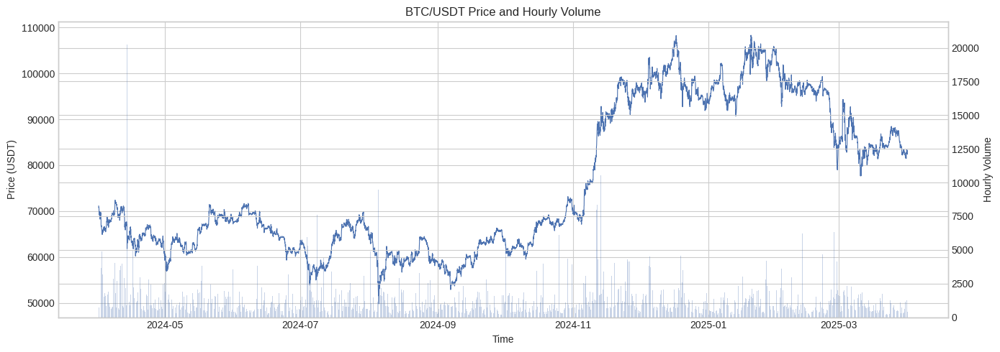

In [18]:
# price + volume overview, downsampled to hourly for speed/readability
plot_df = clean_df.resample("1h").agg({
    "close": "last",
    "volume": "sum"
}).dropna()

fig, ax1 = plt.subplots(figsize=(14, 5))

ax1.plot(plot_df.index, plot_df["close"], linewidth=0.8)
ax1.set_ylabel("Price (USDT)")
ax1.set_xlabel("Time")

ax2 = ax1.twinx()
ax2.bar(plot_df.index, plot_df["volume"], alpha=0.3, width=0.03)
ax2.set_ylabel("Hourly Volume")

ax1.set_title("BTC/USDT Price and Hourly Volume")
plt.tight_layout()
plt.savefig(OUTPUT_FIGURES / "01_price_volume.png", dpi=150)
plt.show()

**Analysis:**  
This overview shows the broad BTC/USDT price regime over the year and highlights periods when trading volume increased. The plot is downsampled to hourly frequency only for readability; the actual modeling data remains at the original one-minute frequency. Large volume spikes often occur around periods of sharp price movement, suggesting that market activity and volatility are related.

**Feature decision motivated:**  
This motivates including volume-based features such as `volume_ratio_10`, `volume_ratio_30`, `volume_ratio_60`, and OBV. These features give the models information about whether current trading activity is unusually high relative to recent history.

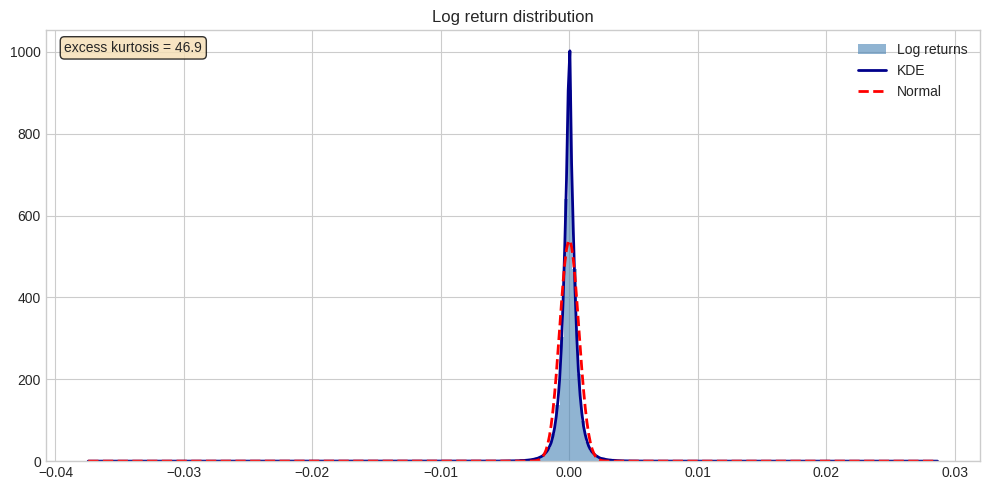

In [19]:
# return distribution vs Normal
fig, ax = plt.subplots(figsize=(10, 5))
rc = rets.dropna()
ax.hist(rc, bins=200, density=True, alpha=0.6, color="steelblue", label="Log returns")
from scipy.stats import gaussian_kde
kde = gaussian_kde(rc)
x = np.linspace(rc.min(), rc.max(), 500)
ax.plot(x, kde(x), color="darkblue", linewidth=2, label="KDE")
mu, sigma = rc.mean(), rc.std()
ax.plot(x, stats.norm.pdf(x, mu, sigma), "r--", linewidth=2, label="Normal")
ax.annotate(f"excess kurtosis = {rc.kurtosis():.1f}",
            xy=(0.02, 0.95), xycoords="axes fraction",
            bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.8))
ax.set_title("Log return distribution"); ax.legend()
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "02_return_distribution.png", dpi=150); plt.show()

**Analysis:**  
The return distribution is much more sharply peaked around zero than the fitted Normal curve, while also having much heavier tails. The annotated excess kurtosis confirms that the distribution is far from Gaussian. In practical terms, most minutes have tiny returns, but occasional extreme moves happen much more often than a Normal model would expect.

**Modeling decision motivated:**  
This supports two choices: first, we do not drop extreme returns as outliers; second, we include a Student-t GARCH model because it is designed to handle heavier-tailed return innovations better than a Gaussian specification.

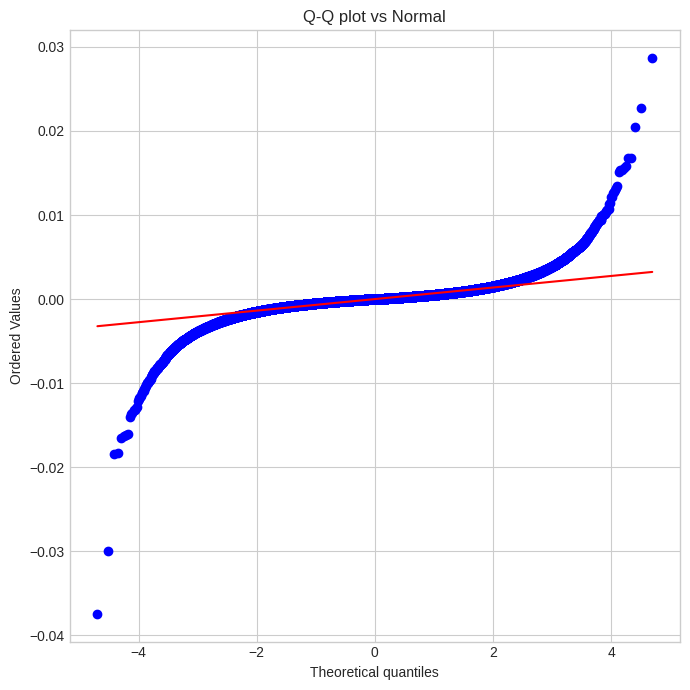

In [20]:
# Q-Q plot
fig, ax = plt.subplots(figsize=(7, 7))
stats.probplot(rets.dropna(), dist="norm", plot=ax)
ax.set_title("Q-Q plot vs Normal")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "03_qq_plot.png", dpi=150); plt.show()

**Analysis:**  
The Q-Q plot compares empirical BTC/USDT returns against the quantiles of a Normal distribution. If returns were approximately Normal, the points would follow the red line closely. Instead, the tails bend far away from the line, especially for the most extreme positive and negative returns.

**Modeling decision motivated:**  
This reinforces the fat-tail conclusion from the histogram and z-score counts. It justifies keeping extreme returns and using a heavy-tailed Student-t innovation distribution in the GARCH model. If the notebook feels too long, this plot is somewhat redundant with the return-distribution plot, but it is a strong visual confirmation.

In [22]:
# ADF Tests
from statsmodels.tsa.stattools import adfuller

# Use every 10th observation for speed; still enough data for a stationarity check
price_sample = clean_df["close"].dropna().iloc[::10]
return_sample = rets.dropna().iloc[::10]

adf_price = adfuller(price_sample, maxlag=20, autolag=None)
adf_return = adfuller(return_sample, maxlag=20, autolag=None)

print(f"ADF on price sample:  stat={adf_price[0]:.3f}, p={adf_price[1]:.3e}")
print(f"ADF on return sample: stat={adf_return[0]:.3f}, p={adf_return[1]:.3e}")

ADF on price sample:  stat=-1.225, p=6.626e-01
ADF on return sample: stat=-51.720, p=0.000e+00


**Analysis:**  
The ADF test suggests that the raw BTC price series is non-stationary, while the log-return series is stationary. This matches financial intuition: prices can trend over time, but short-horizon returns fluctuate around a relatively stable mean. The test is run on a systematic sample for speed, which is sufficient here because the goal is a diagnostic check rather than a formal econometric paper.

**Feature and model decision motivated:**  
This motivates modeling log returns and realized volatility rather than raw BTC prices. It also supports using return-based features such as lagged returns, rolling return statistics, Parkinson/Garman-Klass volatility, and GARCH, all of which operate on price changes rather than price levels.

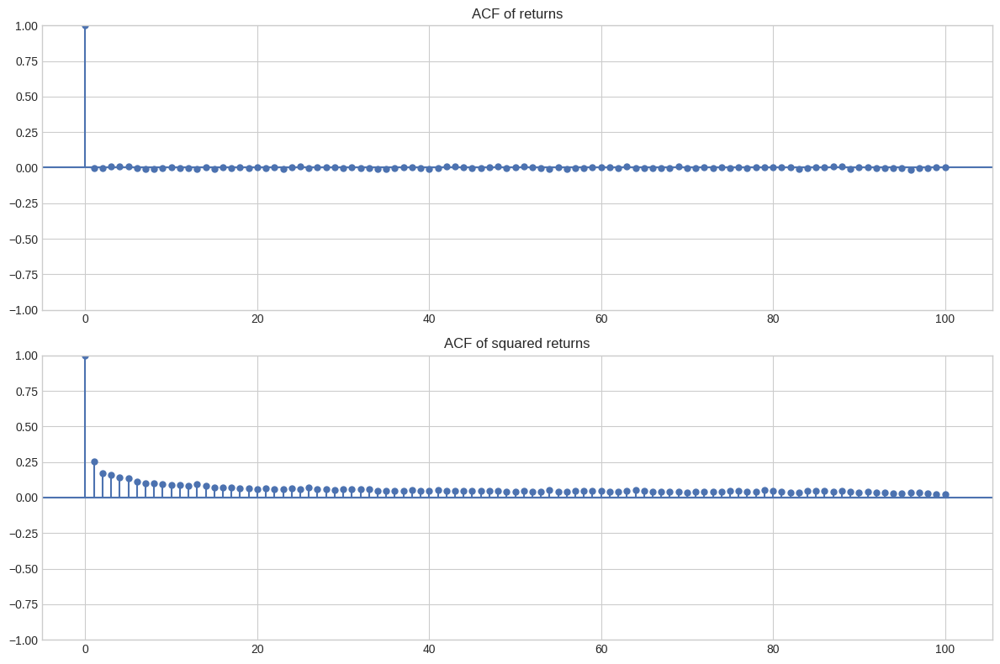

In [24]:
# ACF
from statsmodels.graphics.tsaplots import plot_acf

ret_sample = rets.dropna().iloc[::5]

fig, axes = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(ret_sample, lags=100, ax=axes[0], title="ACF of returns")
plot_acf(ret_sample**2, lags=100, ax=axes[1], title="ACF of squared returns")

plt.tight_layout()
plt.savefig(OUTPUT_FIGURES / "04_acf_squared.png", dpi=150)
plt.show()

**Analysis:**  
The ACF of raw returns is close to zero across most lags, meaning return direction is difficult to predict from past return direction. In contrast, the ACF of squared returns decays slowly and remains positive. This is the classic volatility-clustering pattern: large moves tend to be followed by more large moves, and calm periods tend to remain calm.

**Modeling decision motivated:**  
This is one of the key plots motivating the project. It supports forecasting volatility rather than price direction. It also directly motivates the GARCH model, because GARCH explicitly models persistent conditional variance. For the machine-learning models, it motivates lag features and rolling-window volatility features.

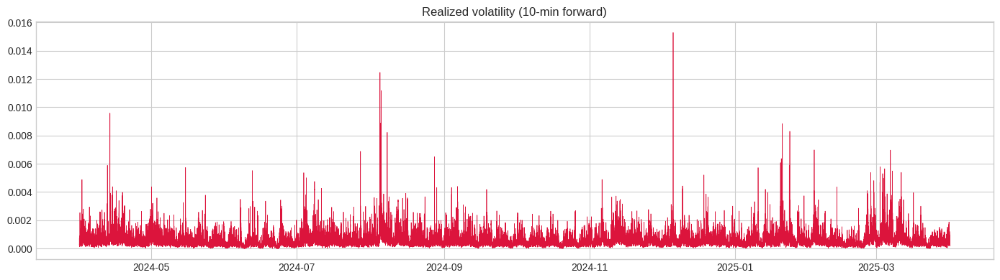

In [25]:
# RV time series
fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(rv.index, rv.values, linewidth=0.5, color="crimson")
ax.set_title("Realized volatility (10-min forward)")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "05_realized_volatility.png", dpi=150); plt.show()

**Analysis:**  
The realized-volatility target is not constant through time. Instead, it appears in bursts: long calm periods are interrupted by clusters of high volatility. This confirms that the target has meaningful time variation and that volatility regimes change over the sample.

**Modeling decision motivated:**  
This motivates using models that can adapt to changing market conditions. Persistence provides a natural baseline because volatility is clustered; GARCH provides a classical time-series model for conditional variance; Lasso and XGBoost test whether engineered candle features can improve on that persistence.

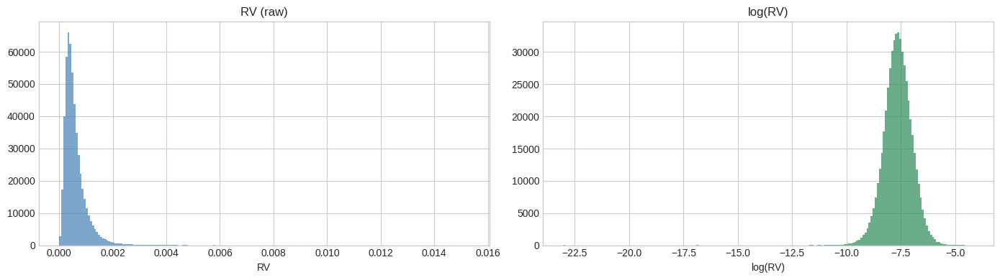

In [26]:
# RV distribution raw vs log-transformed — motivates log target for ML
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].hist(rv, bins=200, color="steelblue", alpha=0.7)
axes[0].set_title("RV (raw)"); axes[0].set_xlabel("RV")
axes[1].hist(np.log(rv + 1e-10), bins=200, color="seagreen", alpha=0.7)
axes[1].set_title("log(RV)"); axes[1].set_xlabel("log(RV)")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "05b_target_dist.png", dpi=150); plt.show()

**Analysis:**  
The raw realized-volatility target is strongly right-skewed. Most observations have low volatility, while a smaller number of minutes have very high volatility. The log transformation makes the target distribution more balanced and closer to symmetric.

**Modeling decision motivated:**  
This motivates training Lasso and XGBoost on `log(RV)` instead of raw RV. Without the log transform, squared-error training would be dominated by the largest volatility spikes. The inverse transform is applied later so that final evaluation still happens on the original realized-volatility scale.

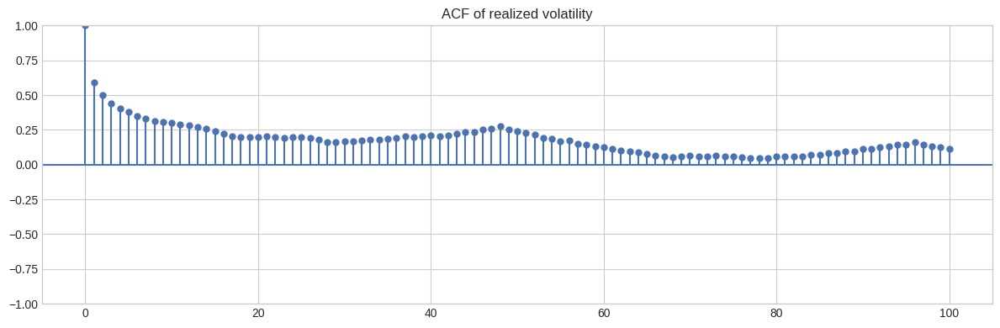

In [28]:
# RV autocorrelation — faster EDA version
rv_sample = rv.dropna().iloc[::30]

fig, ax = plt.subplots(figsize=(12, 4))
plot_acf(
    rv_sample,
    lags=100,
    ax=ax,
    title="ACF of realized volatility",
    fft=True,
    alpha=None
)

plt.tight_layout()
plt.savefig(OUTPUT_FIGURES / "06_rv_acf.png", dpi=150)
plt.show()

**Analysis:**  
The ACF of realized volatility remains positive across many lags, showing that realized volatility is persistent. This means the target itself contains temporal structure: recent volatility gives information about near-future volatility.

**Modeling decision motivated:**  
This motivates the persistence baseline, because a simple “recent volatility predicts next volatility” rule is a meaningful benchmark. It also motivates rolling-window features and return-lag features for Lasso and XGBoost. Any more complex model should beat this persistence structure to justify its added complexity.

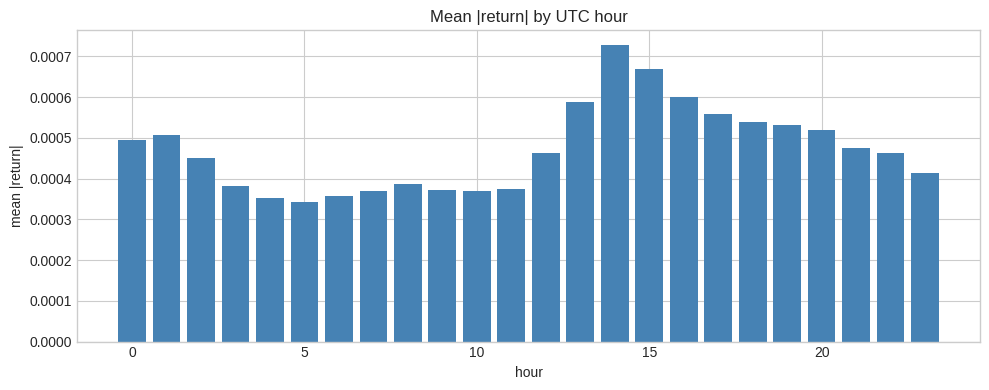

In [29]:
# hour-of-day volatility profile
tmp = pd.DataFrame({"hour": clean_df.index.hour, "abs_ret": rets.abs()}).dropna()
hourly = tmp.groupby("hour")["abs_ret"].mean()
fig, ax = plt.subplots(figsize=(10, 4))
ax.bar(hourly.index, hourly.values, color="steelblue")
ax.set_title("Mean |return| by UTC hour"); ax.set_xlabel("hour"); ax.set_ylabel("mean |return|")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "07_hour_of_day.png", dpi=150); plt.show()

**Analysis:**  
Mean absolute return varies by UTC hour, with clear differences across the day. Even though crypto trades 24/7, activity is not uniform; global trading sessions, liquidity, and news timing can create recurring intraday volatility patterns.

**Feature decision motivated:**  
This motivates including `hour_sin` and `hour_cos` as cyclical time-of-day features. The sine/cosine encoding is important because it tells the model that 23:00 and 00:00 are close in time, rather than treating hour as a simple linear number.

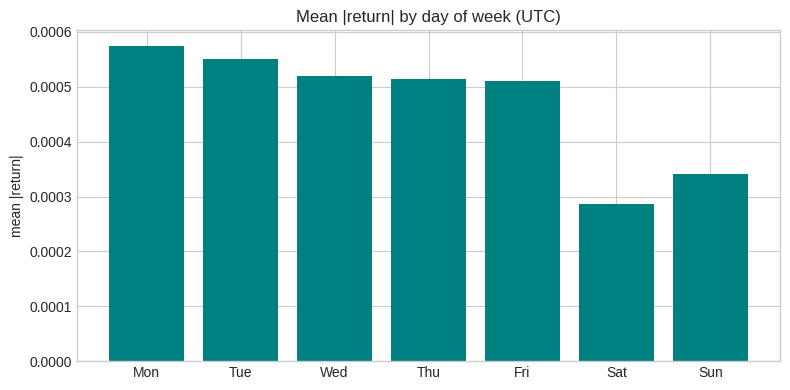

In [30]:
# day-of-week volatility
tmp = pd.DataFrame({"dow": clean_df.index.dayofweek, "abs_ret": rets.abs()}).dropna()
dow = tmp.groupby("dow")["abs_ret"].mean()
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(range(7), dow.values, color="teal",
       tick_label=["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
ax.set_title("Mean |return| by day of week (UTC)"); ax.set_ylabel("mean |return|")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "08_day_of_week.png", dpi=150); plt.show()

**Analysis:**  
The day-of-week plot shows some variation, especially between weekdays and weekends, but this effect is less central to the project than the hour-of-day pattern. Because crypto markets never close, weekday effects are less structurally important than in equity markets.

**Feature decision motivated:**  
This plot explains why the final feature set does not include day-of-week variables. We keep the feature set simpler by using only cyclical hour-of-day features, which capture the stronger and more interpretable intraday pattern.

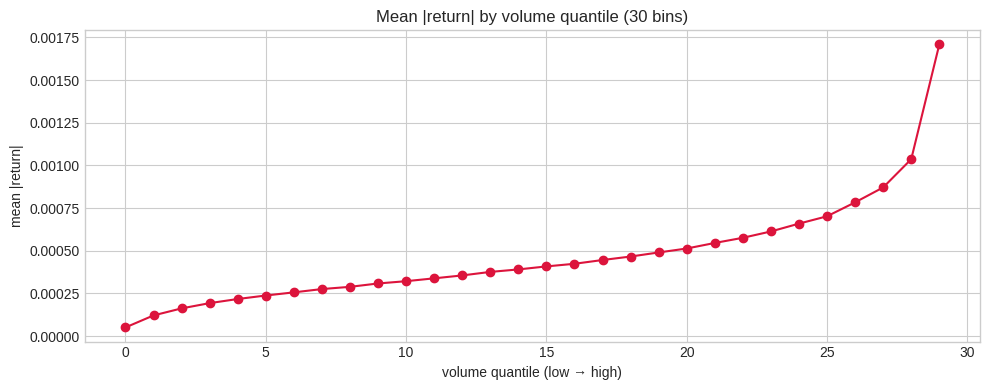

In [31]:
# volume vs volatility scatter (binned)
vol_bins = pd.qcut(clean_df["volume"].rank(method="first"), 30, labels=False)
tmp = pd.DataFrame({"vol_bin": vol_bins, "abs_ret": rets.abs()}).dropna()
binned = tmp.groupby("vol_bin")["abs_ret"].mean()
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(binned.index, binned.values, "o-", color="crimson")
ax.set_title("Mean |return| by volume quantile (30 bins)")
ax.set_xlabel("volume quantile (low → high)"); ax.set_ylabel("mean |return|")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "09_volume_vs_vol.png", dpi=150); plt.show()

**Analysis:**  
The binned volume plot shows a strong positive relationship between volume quantile and mean absolute return. The relationship is especially steep in the highest-volume bins, suggesting that unusually active trading periods coincide with larger price movements.

**Feature decision motivated:**  
This motivates including volume-derived features such as volume ratios and OBV. These features let the models detect when the market is unusually active, which may help forecast short-term volatility.

In [32]:
# leverage effect: sign of return vs next-period volatility
signed = pd.DataFrame({"ret": rets, "next_rv": rv}).dropna()
up   = signed.loc[signed["ret"] > 0,  "next_rv"].mean()
down = signed.loc[signed["ret"] < 0,  "next_rv"].mean()
print(f"mean next-RV after UP move:   {up:.6e}")
print(f"mean next-RV after DOWN move: {down:.6e}")
print(f"asymmetry: {(down - up)/up*100:.2f}% higher after down moves" if down > up else "  (no strong leverage effect)")

mean next-RV after UP move:   5.947079e-04
mean next-RV after DOWN move: 6.021300e-04
asymmetry: 1.25% higher after down moves


**Analysis:**  
The average next-period realized volatility is only slightly higher after negative returns than after positive returns. This suggests that BTC/USDT has, at most, a weak leverage-style asymmetry in this sample. The result is different from the classic equity-market leverage effect, where negative returns often lead to much higher future volatility.

**Feature decision motivated:**  
Because the asymmetry is small, we do not build a large family of specialized leverage-effect features. Instead, we keep general lagged return features, which allow Lasso and XGBoost to learn whether recent signed returns add useful information.

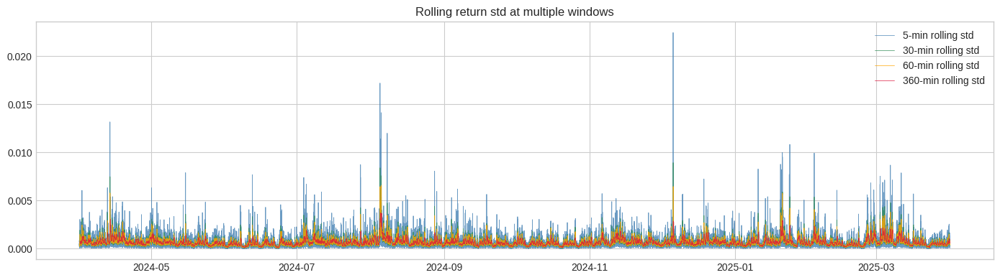

In [33]:
# rolling volatility at multiple windows
fig, ax = plt.subplots(figsize=(14, 4))
for w, c in [(5, "steelblue"), (30, "seagreen"), (60, "orange"), (360, "crimson")]:
    ax.plot(rets.rolling(w).std(), linewidth=0.6, label=f"{w}-min rolling std", color=c, alpha=0.8)
ax.set_title("Rolling return std at multiple windows"); ax.legend()
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "10_rolling_std.png", dpi=150); plt.show()

**Analysis:**  
The rolling standard deviations at different windows move together but react at different speeds. The 5-minute window responds quickly to sudden shocks, while longer windows such as 60 or 360 minutes provide smoother estimates of the broader volatility regime.

**Feature decision motivated:**  
This motivates using multiple rolling windows instead of choosing only one. The model receives short-window features for fast reactions and longer-window features for regime context. This supports the 5/10/30/60-minute rolling statistics used in the feature table.

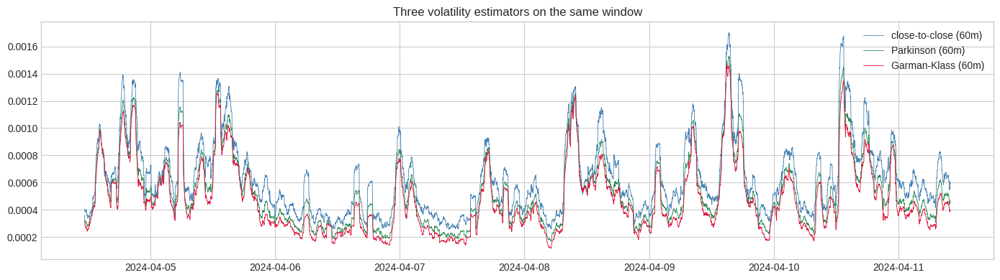

In [34]:
# range-based vs close-to-close volatility
c2c = rets.rolling(60).std()
park = parkinson_vol(clean_df["high"], clean_df["low"], 60)
gk   = garman_klass_vol(clean_df["open"], clean_df["high"], clean_df["low"], clean_df["close"], 60)
fig, ax = plt.subplots(figsize=(14, 4))
sl = slice(5000, 15000)
ax.plot(c2c.iloc[sl], label="close-to-close (60m)",   linewidth=0.6, color="steelblue")
ax.plot(park.iloc[sl], label="Parkinson (60m)",       linewidth=0.6, color="seagreen")
ax.plot(gk.iloc[sl],   label="Garman-Klass (60m)",    linewidth=0.6, color="crimson")
ax.set_title("Three volatility estimators on the same window"); ax.legend()
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "11_vol_estimators.png", dpi=150); plt.show()

**Analysis:**  
The close-to-close, Parkinson, and Garman-Klass volatility estimates generally move together, but they are not identical. Close-to-close volatility only uses closing prices, while Parkinson and Garman-Klass use the high-low range and full OHLC candle structure. This allows them to capture intraminute movement that close-to-close returns may miss.

**Feature decision motivated:**  
This motivates including all three types of volatility signals. Range-based estimators provide additional information about within-candle price movement, and the later Lasso/XGBoost feature-importance analysis can decide whether these features add predictive value.

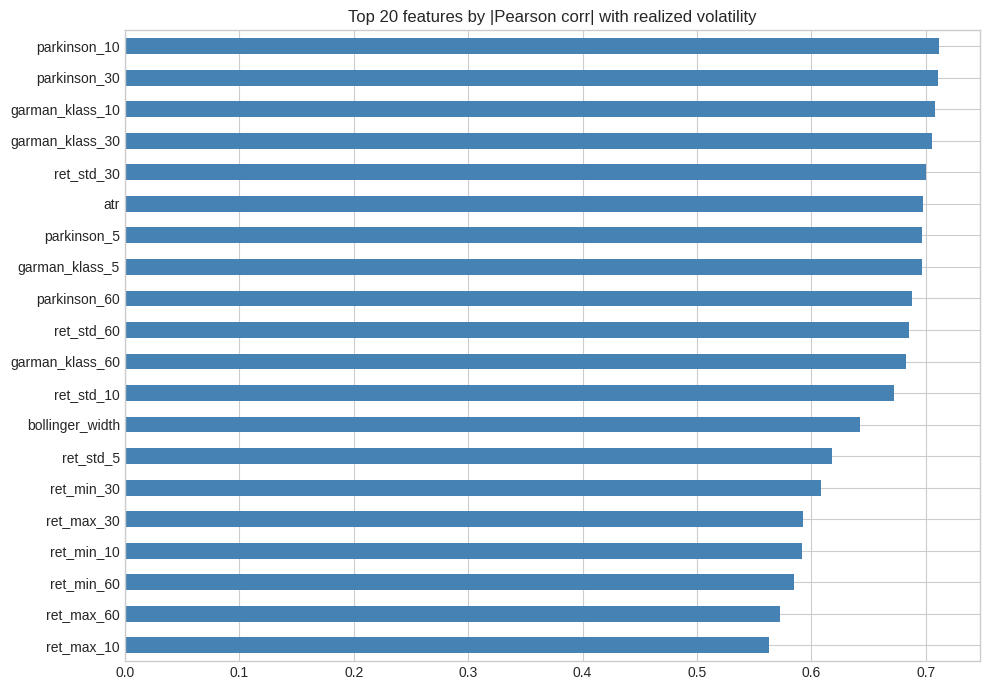

In [35]:
# univariate feature→target correlation ranking (top 20)
aligned = features.loc[features.index.intersection(rv.index)]
y_aligned = rv.loc[aligned.index]
corrs = aligned.corrwith(y_aligned).abs().sort_values(ascending=False).head(20)
fig, ax = plt.subplots(figsize=(10, 7))
corrs.iloc[::-1].plot(kind="barh", ax=ax, color="steelblue")
ax.set_title("Top 20 features by |Pearson corr| with realized volatility")
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "12_feature_target_corr.png", dpi=150); plt.show()

**Analysis:**  
The highest univariate correlations with future realized volatility are mostly volatility-related features: Parkinson, Garman-Klass, ATR, Bollinger width, and rolling return standard deviations. This is a useful sanity check because the features most related to the target are exactly the ones theory would suggest.

**Modeling decision motivated:**  
This supports using the engineered feature set for Lasso and XGBoost. It also suggests that the models should not rely mainly on arbitrary noise features; the strongest signals come from interpretable volatility families. However, this is only a univariate check, so the final test still comes from out-of-sample model evaluation.

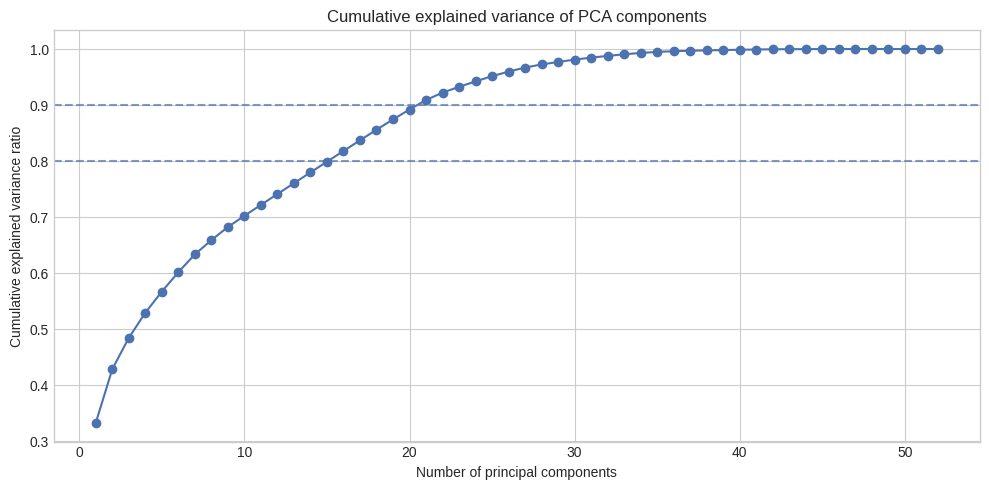

In [17]:
# PCA as supporting visualization

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

# align feature matrix with target timestamps
Xa = features.loc[features.index.intersection(rv.index)]
n_train_eda = int(len(Xa) * TRAIN_RATIO)

# fit only on the training block
scaler_eda = StandardScaler().fit(Xa.iloc[:n_train_eda].values)
X_train_scaled = scaler_eda.transform(Xa.iloc[:n_train_eda].values)

pca_full = PCA().fit(X_train_scaled)

explained = pca_full.explained_variance_ratio_
cum_explained = np.cumsum(explained)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(range(1, len(cum_explained) + 1), cum_explained, marker="o")
ax.set_xlabel("Number of principal components")
ax.set_ylabel("Cumulative explained variance ratio")
ax.set_title("Cumulative explained variance of PCA components")
ax.axhline(0.8, linestyle="--", alpha=0.7)
ax.axhline(0.9, linestyle="--", alpha=0.7)
plt.tight_layout()
plt.savefig(OUTPUT_FIGURES / "13_pca_cumulative_variance.png", dpi=150)
plt.show()

**Analysis:**  
The PCA cumulative variance curve shows that the engineered feature matrix has some shared low-dimensional structure, but it does not collapse into only one or two components. The first few components explain a meaningful share of variance, while reaching 80–90% requires many more components.

**Modeling decision motivated:**  
This supports keeping the full engineered feature set rather than replacing it with only a small number of PCA components. PCA is used here only as an EDA diagnostic, not as part of the modeling pipeline, because Lasso and XGBoost benefit from the original interpretable feature names for feature selection and importance analysis.

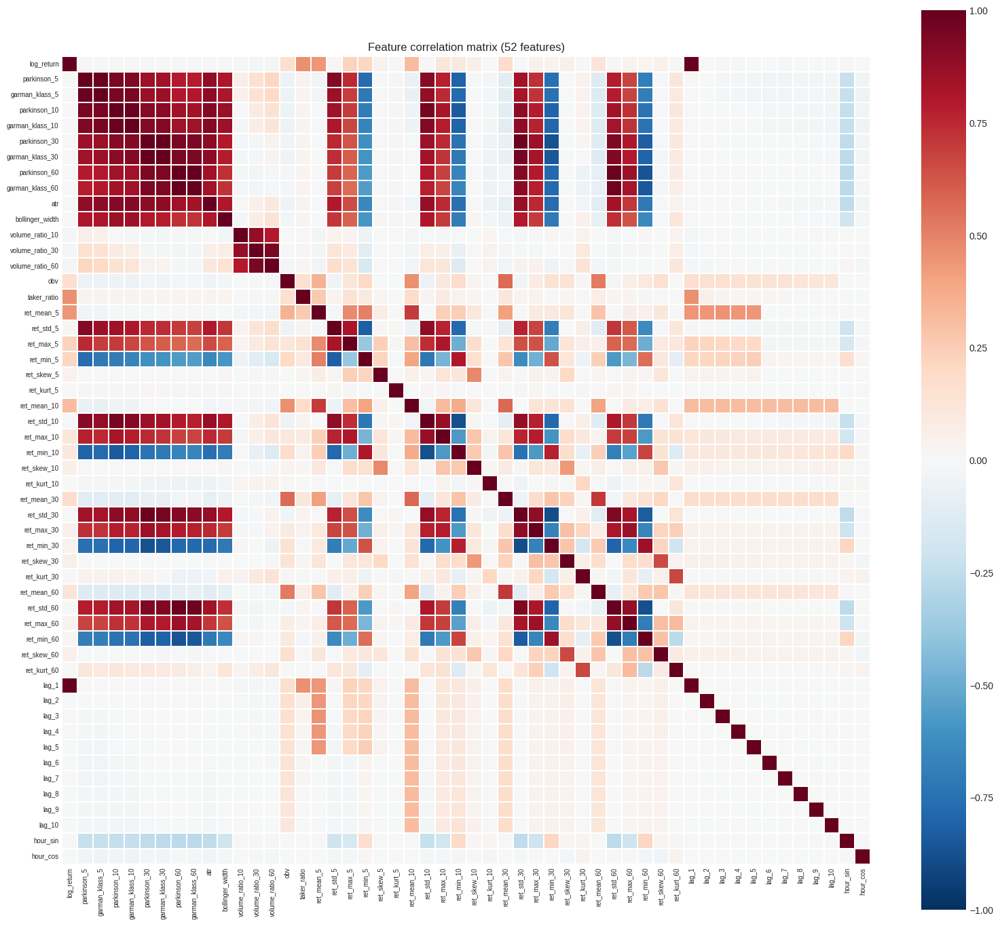

In [37]:
corr = features.corr()

fig, ax = plt.subplots(figsize=(16, 14))
sns.heatmap(
    corr,
    cmap="RdBu_r",
    center=0,
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0.3,
    ax=ax,
    xticklabels=True,
    yticklabels=True
)

ax.set_title(f"Feature correlation matrix ({features.shape[1]} features)")
plt.xticks(rotation=90, fontsize=7)
plt.yticks(fontsize=7)
plt.tight_layout()
plt.savefig(OUTPUT_FIGURES / "14_correlation.png", dpi=150)
plt.show()

**Analysis:**  
The correlation heatmap shows clear blocks of correlated features. This is expected because several feature families measure related concepts: range-based volatility, rolling return standard deviation, ATR, and Bollinger width all describe recent volatility from different angles. The presence of correlation does not mean the features are wrong; it means the engineered set contains overlapping views of the same market behavior.

**Modeling decision motivated:**  
This motivates using Lasso and XGBoost rather than manually dropping features by an arbitrary correlation threshold. Lasso can shrink weak or redundant predictors toward zero, while XGBoost can handle nonlinear relationships and interactions among correlated inputs. The later feature-importance section checks whether both models rely on sensible feature groups.

## 7. Train / Val / Test Split

Chronological split: 85% train / 5% val / 10% test. No shuffling, ever time series. The val block is used for Lasso α selection and XGBoost Optuna tuning; the test block is untouched until final evaluation.

**Feature compatibility across models:**
- **Persistence**: uses `y` only (no features).
- **GARCH**: uses raw log returns only.
- **Lasso**: uses `X_scaled` (StandardScaler fit on `[:train_end]` once, applied throughout). Target = log(RV). Lasso requires scaling because L1 is scale-sensitive.
- **XGBoost**: uses raw `X` (trees are scale-invariant). Target = log(RV).

All ML predictions are inverse-transformed via `exp(·) − ε` before metrics and bootstrap, so every model is compared on the same original RV scale.

In [14]:
# split chronologically
common_idx = features.index.intersection(rv.index)
X = features.loc[common_idx]
y = rv.loc[common_idx]

n = len(X)
train_end = int(n * TRAIN_RATIO)
val_end   = int(n * (TRAIN_RATIO + VAL_RATIO))

print(f"total rows:  {n:,}")
print(f"train:       0 .. {train_end:,}")
print(f"val:   {train_end:,} .. {val_end:,}")
print(f"test:  {val_end:,} .. {n:,}")
print(f"test time range: {X.index[val_end]} → {X.index[-1]}")

total rows:  525,193
train:       0 .. 446,414
val:   446,414 .. 472,673
test:  472,673 .. 525,193
test time range: 2025-02-23 11:25:00+00:00 → 2025-03-31 23:49:00+00:00


In [18]:
scaler = StandardScaler().fit(X.iloc[:train_end].values)
X_scaled_arr = scaler.transform(X.values)
X_scaled = pd.DataFrame(X_scaled_arr, index=X.index, columns=X.columns)

# log-transform target (for Lasso + XGBoost)
y_log = np.log(y + 1e-10)
print("scaler fitted on train only.  X_scaled and y_log ready.")

scaler fitted on train only.  X_scaled and y_log ready.


## 8. Model 1: Persistence Baseline

The simplest possible forecast: "tomorrow's RV equals yesterday's RV." Two lines of code. Every other model must beat this floor to justify its complexity.

In [31]:
persistence_preds = y.shift(1).iloc[val_end:]
persistence_preds = persistence_preds.dropna()
print(f"persistence predictions on test: {len(persistence_preds):,}")
persistence_preds.head()

persistence predictions on test: 52,520


,close
timestamp,
2025-02-23 11:25:00+00:00,0.000092
2025-02-23 11:26:00+00:00,0.000095
2025-02-23 11:27:00+00:00,0.000089
2025-02-23 11:28:00+00:00,0.000089
2025-02-23 11:29:00+00:00,0.000091


## 9. Model 2: GARCH(1,1) with Student-t

$h_t = \omega + \alpha \epsilon_{t-1}^2 + \beta h_{t-1}$

Volatility clusters (we saw this in the ACF of squared returns), so we model $h_t$ explicitly as persistent. Student-t innovations handle the fat tails we saw in the Q-Q plot. We refit parameters every 500 steps on a 5000-min rolling window, but update $h_t$ every single minute using the recursion.

In [32]:
!pip -q install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 17.4 MB/s eta 0:00:00


In [33]:
from arch import arch_model

GARCH_SCALE  = 100
GARCH_WINDOW = 5000
GARCH_REFIT  = 500

def garch_forecast(returns, start_pos, window=GARCH_WINDOW, refit=GARCH_REFIT,
                   horizon=TARGET_WINDOW, scale=GARCH_SCALE):
    s = returns * scale
    preds = pd.Series(index=returns.index, dtype=float)
    omega = alpha = beta = mu = h_t = None
    for t in tqdm(range(start_pos, len(s)), desc="GARCH"):
        if omega is None or (t - start_pos) % refit == 0:
            w0 = max(0, t - window)
            try:
                am = arch_model(s.iloc[w0:t], p=1, q=1, mean="constant",
                                vol="GARCH", dist="t", rescale=False)
                res = am.fit(disp="off", show_warning=False)
                omega = res.params["omega"]
                alpha = res.params["alpha[1]"]
                beta  = res.params["beta[1]"]
                mu    = res.params["mu"]
                h_t   = res.conditional_volatility.iloc[-1] ** 2
            except Exception:
                continue
        eps = s.iloc[t-1] - mu
        h_t = omega + alpha * eps**2 + beta * h_t
        h_k = h_t; fcs = []
        for _ in range(horizon):
            h_k = omega + (alpha + beta) * h_k
            fcs.append(h_k)
        preds.iloc[t] = np.sqrt(np.mean(fcs)) / scale
    return preds.dropna()

rets_aligned = rets.loc[X.index]
garch_preds = garch_forecast(rets_aligned, start_pos=val_end)
garch_preds.head()

GARCH: 100%|██████████| 52520/52520 [00:10<00:00, 5034.88it/s]


,0
timestamp,
2025-02-23 11:25:00+00:00,0.003975
2025-02-23 11:26:00+00:00,0.003975
2025-02-23 11:27:00+00:00,0.003975
2025-02-23 11:28:00+00:00,0.003975
2025-02-23 11:29:00+00:00,0.003975


In [38]:
garch_preds.describe()

,0
count,5.252000e+04
mean,1.304049e+04
std,1.330141e+05
min,1.544308e-04
25%,5.116218e-04
50%,7.679681e-04
75%,1.345991e-03
max,1.369773e+06


**Diagonsis:** We found that the typical GARCH forecasts were reasonable, but a few failed refits created impossible forecasts. Since the median and quartiles were normal while the max (and the mean)was enormous, the issue is isolated numerical explosion, not the overall model scale.

In [39]:
print("Raw GARCH prediction summary:")
display(garch_preds.describe())

garch_preds_clean = garch_preds.copy()

# Cap is based on the realized-volatility scale in the same prediction window
cap = max(
    y.loc[garch_preds_clean.index].quantile(0.999) * 10,
    0.02
)

bad_garch = (
    (~np.isfinite(garch_preds_clean))
    | (garch_preds_clean <= 0)
    | (garch_preds_clean > cap)
)

print(f"GARCH unstable predictions removed: {bad_garch.sum()} / {len(garch_preds_clean)}")
print(f"cap used: {cap:.6f}")

garch_preds_clean[bad_garch] = np.nan
garch_preds_clean = garch_preds_clean.dropna()

print("Cleaned GARCH prediction summary:")
display(garch_preds_clean.describe())

Raw GARCH prediction summary:


,0
count,5.252000e+04
mean,1.304049e+04
std,1.330141e+05
min,1.544308e-04
25%,5.116218e-04
50%,7.679681e-04
75%,1.345991e-03
max,1.369773e+06


GARCH unstable predictions removed: 1000 / 52520
cap used: 0.049368
Cleaned GARCH prediction summary:


,0
count,51520.000000
mean,0.001279
std,0.002197
min,0.000154
25%,0.000507
50%,0.000758
75%,0.001272
max,0.021434


**GARCH numerical-stability check:**

The raw rolling GARCH forecasts mostly have a realistic scale: the 25th percentile, median, and 75th percentile are all around the same order of magnitude as realized volatility. However, the mean, standard deviation, and maximum are distorted by a small number of extreme forecast explosions. For example, the maximum raw GARCH prediction is far outside the scale of the target, while the median remains normal.

This indicates a numerical stability issue in a few rolling GARCH refits rather than a problem with the underlying BTC data. GARCH models can become unstable when a rolling window estimates near-nonstationary variance dynamics or when an extreme return causes the recursive variance forecast to blow up.

For evaluation, we treat non-finite, non-positive, or implausibly large GARCH forecasts as failed model refits and remove them before aligning the common test window. This does not remove any actual volatility observations; it only removes invalid model outputs. The cleaned GARCH series is then compared against Persistence, Lasso, and XGBoost on the same remaining timestamps.

## 10. Model 3: Lasso Linear Regression

Lasso gives us two things at once: a **linear baseline** that tests how far straight-line relationships go, and **automatic feature selection** via L1 shrinkage. Non-zero coefficients = features Lasso considers useful.

**Protocol:**

1. Tune α once using a recent 100,000-row slice of the training block with manual `TimeSeriesSplit`, avoiding shuffled K-fold leakage.
2. Use the selected fixed α for walk-forward test prediction, refitting every 500 steps starting at `val_end`.
3. Fit one final Lasso on train+validation data only to read feature coefficients.
4. Predict the test block only.


The alpha search is limited to a compact grid and a recent training slice for runtime reasons, but it still preserves chronological validation and keeps the test block untouched.


In [19]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import TimeSeriesSplit
from sklearn.exceptions import ConvergenceWarning
import warnings

tune_size = 100_000
start_tune = max(0, train_end - tune_size)

Xt = X_scaled.iloc[start_tune:train_end].values
yt = y_log.iloc[start_tune:train_end].values

# hyperparameter tuning
alphas = np.logspace(-4, -1, 8)
tscv = TimeSeriesSplit(n_splits=3)

cv_mse = []

for a in alphas:
    fold_mse = []
    for tr, va in tscv.split(Xt):
        m = Lasso(
            alpha=a,
            max_iter=20000,
            tol=1e-3,
            random_state=SEED
        )
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", ConvergenceWarning)
            m.fit(Xt[tr], yt[tr])

        pred = m.predict(Xt[va])
        fold_mse.append(np.mean((yt[va] - pred) ** 2))

    cv_mse.append(np.mean(fold_mse))

cv_mse = np.array(cv_mse)
best_alpha = alphas[cv_mse.argmin()]

print(f"best alpha = {best_alpha:.2e}, CV MSE = {cv_mse.min():.4f}")

best alpha = 5.18e-03, CV MSE = 0.1807


In [20]:
def lasso_walk_forward(X_arr, y_arr, alpha, start, refit=500):
    n = len(X_arr)
    preds = np.full(n, np.nan)
    model = None
    for t in tqdm(range(start, n), desc="Lasso walk-forward"):
        if model is None or (t - start) % refit == 0:
            model = Lasso(alpha=alpha, max_iter=20000, random_state=SEED)
            model.fit(X_arr[:t], y_arr[:t])
        preds[t] = model.predict(X_arr[t:t+1])[0]
    return preds

lasso_preds_log = lasso_walk_forward(X_scaled.values, y_log.values, best_alpha, start=val_end, refit=2000)
lasso_preds = pd.Series(np.exp(lasso_preds_log) - 1e-10, index=X.index).dropna()
lasso_preds.head()

Lasso walk-forward: 100%|██████████| 52520/52520 [01:34<00:00, 555.67it/s]


,0
timestamp,
2025-02-23 11:25:00+00:00,0.000264
2025-02-23 11:26:00+00:00,0.000258
2025-02-23 11:27:00+00:00,0.000266
2025-02-23 11:28:00+00:00,0.000285
2025-02-23 11:29:00+00:00,0.000267


In [21]:
# final Lasso fit on full train+val block for feature-importance reading
lasso_final = Lasso(alpha=best_alpha, max_iter=20000, random_state=SEED)
lasso_final.fit(X_scaled.iloc[:val_end].values, y_log.iloc[:val_end].values)
lasso_coefs = pd.Series(lasso_final.coef_, index=X.columns).sort_values(key=abs, ascending=False)
print(f"non-zero coefficients: {(lasso_coefs != 0).sum()} / {len(lasso_coefs)}")
lasso_coefs.head(15)

non-zero coefficients: 24 / 52


,0
ret_std_60,0.232122
parkinson_5,0.061048
ret_std_30,0.052149
bollinger_width,0.047439
atr,0.047254
ret_kurt_60,-0.045719
hour_sin,-0.045024
volume_ratio_60,0.042255
ret_kurt_30,-0.034969
ret_min_60,0.024190


**Lasso results and interpretation:**

The TimeSeriesSplit tuning selected `alpha = 5.18e-03` with a validation CV MSE of `0.1807` on the log-realized-volatility target. This gives us a regularized linear benchmark: the model is still simple and interpretable, but the nonzero alpha prevents it from freely using all correlated features.

The walk-forward prediction step then produced test-window forecasts starting at `val_end`. This is important because each prediction is made using only information available up to that point in time, matching the no-leakage setup used throughout the project.

The final Lasso fit selected **24 out of 52 features**, meaning it shrank more than half of the engineered features to zero. The largest coefficients are mainly volatility-related features:

- `ret_std_60`
- `parkinson_5`
- `ret_std_30`
- `bollinger_width`
- `atr`
- `volume_ratio_60`
- `parkinson_10`
- `garman_klass_5`

This is a good sanity check: Lasso is mostly choosing features that measure recent volatility, trading range, and market activity, which matches the EDA. The strongest coefficient, `ret_std_60`, suggests that the recent 60-minute volatility level is especially informative for predicting the next 10-minute realized volatility. Shorter range-based estimators such as `parkinson_5` and `garman_klass_5` add more reactive information from the candle high-low range. Volume and time-of-day features also survive, but with smaller coefficients, suggesting they add secondary context rather than driving the forecast.

Overall, Lasso supports the feature-engineering story: near-future volatility is mainly explained by recent volatility, range-based candle movement, and volume/activity signals. It also gives us a sparse linear benchmark to compare against the nonlinear XGBoost model.

## 11. Model 4: XGBoost with Optuna (Bayesian HPO)

XGBoost is the non-linear counterpart to Lasso. It's an ensemble of boosted decision trees, so it natively handles feature interactions, non-linearities, and correlated features without requiring scaling. We tune its hyperparameters with Optuna's TPE (Tree-structured Parzen Estimator) sampler — a Bayesian-optimization method that's smarter than grid search.

In [23]:
!pip -q install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 9.3 MB/s eta 0:00:00


In [24]:
import optuna
import xgboost as xgb

optuna.logging.set_verbosity(optuna.logging.WARNING)

tune_size = 150_000
start_tune = max(0, train_end - tune_size)

train_X = X.iloc[start_tune:train_end].values
train_y = y_log.iloc[start_tune:train_end].values
val_X   = X.iloc[train_end:val_end].values
val_y   = y_log.iloc[train_end:val_end].values

def objective(trial):
    params = {
        "max_depth": trial.suggest_int("max_depth", 3, 6),
        "learning_rate": trial.suggest_float("learning_rate", 0.02, 0.15, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 8),
        "gamma": trial.suggest_float("gamma", 0.0, 0.2),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 0.5),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 2.0),
        "n_jobs": -1,
        "random_state": SEED,
        "objective": "reg:squarederror",
        "tree_method": "hist",
        "eval_metric": "rmse",
    }

    m = xgb.XGBRegressor(**params)
    m.fit(
        train_X,
        train_y,
        eval_set=[(val_X, val_y)],
        verbose=False,
    )

    pred = m.predict(val_X)
    return float(np.mean((val_y - pred) ** 2))

study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(seed=SEED)
)

study.optimize(objective, n_trials=20, show_progress_bar=True)

best_params = study.best_params
best_params.update(
    n_jobs=-1,
    random_state=SEED,
    objective="reg:squarederror",
    tree_method="hist",
    eval_metric="rmse",
)

print("best params:", best_params)

  0%|          | 0/20 [00:00<?, ?it/s]

best params: {'max_depth': 5, 'learning_rate': 0.06598254106850841, 'n_estimators': 118, 'subsample': 0.8822634555704315, 'colsample_bytree': 0.7511572371061874, 'min_child_weight': 1, 'gamma': 0.18977710745066667, 'reg_alpha': 0.4828160165372797, 'reg_lambda': 1.7125960221746916, 'n_jobs': -1, 'random_state': 42, 'objective': 'reg:squarederror', 'tree_method': 'hist', 'eval_metric': 'rmse'}


In [25]:
def xgb_walk_forward(X_arr, y_arr, params, start, refit=2000):
    n = len(X_arr)
    preds = np.full(n, np.nan)
    model = None

    for t in tqdm(range(start, n), desc="XGBoost walk-forward"):
        if model is None or (t - start) % refit == 0:
            model = xgb.XGBRegressor(**params)
            model.fit(X_arr[:t], y_arr[:t], verbose=False)

        preds[t] = model.predict(X_arr[t:t+1])[0]

    return preds

xgb_preds_log = xgb_walk_forward(
    X.values,
    y_log.values,
    best_params,
    start=val_end,
    refit=2000
)

xgb_preds = pd.Series(np.exp(xgb_preds_log) - 1e-10, index=X.index).dropna()
xgb_preds.head()

XGBoost walk-forward: 100%|██████████| 52520/52520 [02:16<00:00, 385.29it/s]


,0
timestamp,
2025-02-23 11:25:00+00:00,0.000177
2025-02-23 11:26:00+00:00,0.000174
2025-02-23 11:27:00+00:00,0.000174
2025-02-23 11:28:00+00:00,0.000174
2025-02-23 11:29:00+00:00,0.000169


In [26]:
xgb_final = xgb.XGBRegressor(**best_params)
xgb_final.fit(X.iloc[:val_end].values, y_log.iloc[:val_end].values, verbose=False)

xgb_importance = pd.Series(
    xgb_final.feature_importances_,
    index=X.columns
).sort_values(ascending=False)

xgb_importance.head(15)

,0
parkinson_30,0.472435
parkinson_10,0.146775
garman_klass_10,0.091152
parkinson_60,0.089209
garman_klass_5,0.027848
parkinson_5,0.026567
ret_std_60,0.014351
atr,0.013955
ret_skew_5,0.010488
garman_klass_30,0.010409


## 12. Feature Importance and Agreement (Side Quest):

Question: do two independent algorithms looking at the same features?

Agreement suggests a strong evidence that the top-ranked features really are predictive (rather than one model over-fitting to noise).

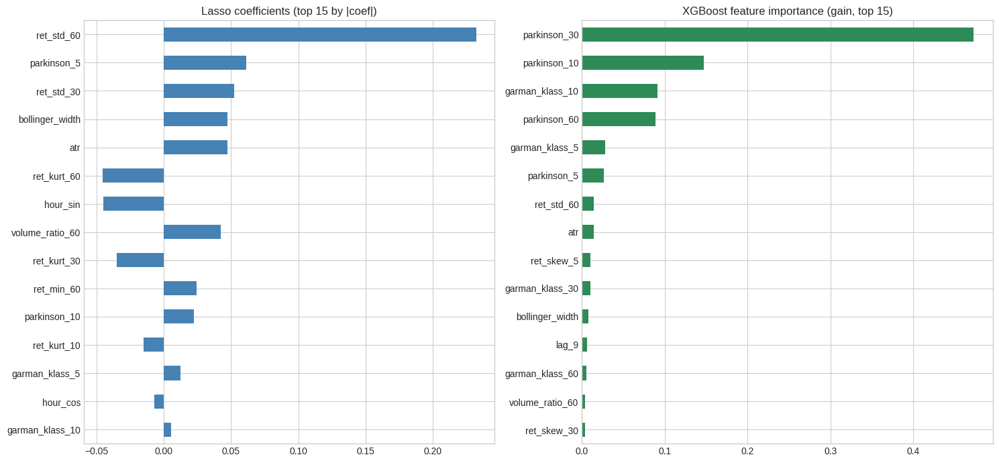

overlap (top 15 of each): 8 features
agreed-on features: ['atr', 'bollinger_width', 'garman_klass_10', 'garman_klass_5', 'parkinson_10', 'parkinson_5', 'ret_std_60', 'volume_ratio_60']


In [27]:
top_k = 15
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

lasso_top = lasso_coefs.reindex(lasso_coefs.abs().sort_values(ascending=False).index).head(top_k)
lasso_top.iloc[::-1].plot(kind="barh", ax=axes[0], color="steelblue")
axes[0].set_title("Lasso coefficients (top 15 by |coef|)")

xgb_importance.head(top_k).iloc[::-1].plot(kind="barh", ax=axes[1], color="seagreen")
axes[1].set_title("XGBoost feature importance (gain, top 15)")

plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "16_feature_importance.png", dpi=150); plt.show()

# agreement
lasso_set = set(lasso_top.index)
xgb_set   = set(xgb_importance.head(top_k).index)
print(f"overlap (top 15 of each): {len(lasso_set & xgb_set)} features")
print(f"agreed-on features: {sorted(lasso_set & xgb_set)}")

In [28]:
# feature selection: retrain XGBoost on Lasso-selected subset only
selected = lasso_coefs[lasso_coefs != 0].index.tolist()
print(f"Lasso selected {len(selected)} / {len(X.columns)} features")

xgb_sel = xgb.XGBRegressor(**best_params)
xgb_sel.fit(X.iloc[:val_end][selected].values, y_log.iloc[:val_end].values, verbose=False)
xgb_sel_preds_val = xgb_sel.predict(X.iloc[train_end:val_end][selected].values)
xgb_full_preds_val = xgb_final.predict(X.iloc[train_end:val_end].values)

mse_full = float(np.mean((y_log.iloc[train_end:val_end].values - xgb_full_preds_val)**2))
mse_sel  = float(np.mean((y_log.iloc[train_end:val_end].values - xgb_sel_preds_val )**2))
print(f"XGBoost val MSE, all {len(X.columns)} features: {mse_full:.4f}")
print(f"XGBoost val MSE, {len(selected)} Lasso-selected: {mse_sel:.4f}")
print(f"difference: {(mse_sel - mse_full)/mse_full*100:+.2f}%")

Lasso selected 24 / 52 features
XGBoost val MSE, all 52 features: 0.1266
XGBoost val MSE, 24 Lasso-selected: 0.1279
difference: +1.03%


**Interpretation:**

The Lasso-selected subset contains 24 of the 52 engineered features. When XGBoost is retrained on only those 24 features, validation MSE increases by only 1.03% relative to the full 52-feature model. This suggests that many removed features are redundant and that a reduced feature set could be attractive for deployment because it is simpler, faster to compute, and easier to interpret.

However, we keep the full 52-feature XGBoost model as the main final model because it is the version used in the full walk-forward test evaluation. This also keeps the comparison fair across algorithms: Lasso, XGBoost, and the other models are evaluated as forecasting methods under the same test-window protocol, rather than changing both the model class and the feature set at the same time. The reduced-feature XGBoost result is therefore treated as a model-simplification experiment, not as the primary reported model.

## 13. Evaluation: Six Metrics on the Same Test Window

We use multiple metrics because volatility forecasts can be “good” in different ways. MSE and RMSE penalize large misses heavily, which matters because underpredicting volatility spikes is costly for risk management. MAE is more robust and tells us the typical absolute forecast error. QLIKE is included because it is commonly used for volatility forecasting and penalizes bad variance forecasts asymmetrically. R² measures how much variation in realized volatility the model explains relative to a simple mean benchmark. Directional accuracy checks whether the model at least gets the direction of volatility changes right, which is useful for trading or risk-adjustment decisions.

Together, these metrics let us compare models not just by average error, but also by spike sensitivity, volatility-specific loss, explanatory power, and directional usefulness.

| Metric | Why we include it |
|---|---|
| MSE | Penalizes large volatility forecast errors heavily |
| RMSE | Same units as realized volatility, easier to interpret than MSE |
| MAE | Robust view of typical forecast error |
| QLIKE | Volatility-specific loss based on variance forecast quality |
| R² | Measures explanatory power relative to a mean benchmark |
| Directional Accuracy | Checks whether the model predicts volatility increases/decreases |

In [40]:
def mse(a, p):  return float(np.mean((a - p)**2))
def rmse(a, p): return float(np.sqrt(mse(a, p)))
def mae(a, p):  return float(np.mean(np.abs(a - p)))
def qlike(a, p):
    a_var = a**2; p_var = np.clip(p**2, 1e-20, None)
    r = a_var / p_var
    return float(np.mean(r - np.log(r) - 1))
def r2(a, p):
    ss_res = np.sum((a - p)**2); ss_tot = np.sum((a - a.mean())**2)
    return 0.0 if ss_tot < 1e-20 else float(1 - ss_res/ss_tot)
def da(a, p):
    ad = np.sign(np.diff(a)); pd_ = np.sign(np.diff(p))
    return 0.0 if len(ad) == 0 else float(np.mean(ad == pd_))

def all_metrics(a, p):
    return {"MSE": mse(a,p), "RMSE": rmse(a,p), "MAE": mae(a,p),
            "QLIKE": qlike(a,p), "R2": r2(a,p), "DA": da(a,p)}

In [41]:
test_idx = X.index[val_end:]
common = (
    test_idx
    .intersection(persistence_preds.index)
    .intersection(garch_preds_clean.index)
    .intersection(lasso_preds.index)
    .intersection(xgb_preds.index)
)

pred_df = pd.DataFrame({
    "actual": y.loc[common],
    "persistence": persistence_preds.loc[common],
    "garch": garch_preds_clean.loc[common],
    "lasso": lasso_preds.loc[common],
    "xgboost": xgb_preds.loc[common],
}).dropna()

results = {
    "Persistence": all_metrics(pred_df["actual"].values, pred_df["persistence"].values),
    "GARCH":       all_metrics(pred_df["actual"].values, pred_df["garch"].values),
    "Lasso":       all_metrics(pred_df["actual"].values, pred_df["lasso"].values),
    "XGBoost":     all_metrics(pred_df["actual"].values, pred_df["xgboost"].values),
}
metrics_df = pd.DataFrame(results).T
metrics_df.index.name = "Model"
metrics_df.to_csv(OUTPUT_TABLES / "metrics.csv")
metrics_df

,MSE,RMSE,MAE,QLIKE,R2,DA
Model,,,,,,
Persistence,1.122079e-08,0.000106,0.000053,17.362375,0.958460,0.502708
GARCH,5.133843e-06,0.002266,0.000725,0.761866,-18.005967,0.500883
Lasso,6.888667e-07,0.000830,0.000253,0.429945,-1.550249,0.498612
XGBoost,1.011320e-07,0.000318,0.000174,0.373069,0.625600,0.497195


**Analysis:**

The metrics show a split conclusion. Persistence is best on point-error metrics because realized volatility is highly autocorrelated and adjacent 10-minute RV windows overlap. However, XGBoost is best on QLIKE, the volatility-specific loss, which suggests it gives the strongest variance-scale forecast among the learned models.

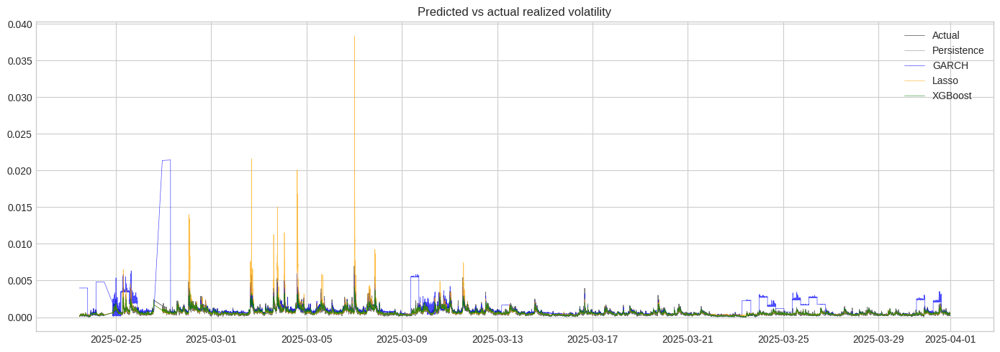

In [42]:
# predictions overlay
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(pred_df.index, pred_df["actual"],      color="black",    linewidth=0.5, alpha=0.7, label="Actual")
ax.plot(pred_df.index, pred_df["persistence"], color="gray",     linewidth=0.5, alpha=0.7, label="Persistence")
ax.plot(pred_df.index, pred_df["garch"],       color="blue",     linewidth=0.5, alpha=0.7, label="GARCH")
ax.plot(pred_df.index, pred_df["lasso"],       color="orange",   linewidth=0.5, alpha=0.7, label="Lasso")
ax.plot(pred_df.index, pred_df["xgboost"],     color="green",    linewidth=0.5, alpha=0.7, label="XGBoost")
ax.set_title("Predicted vs actual realized volatility"); ax.legend()
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "17_predictions.png", dpi=150); plt.show()

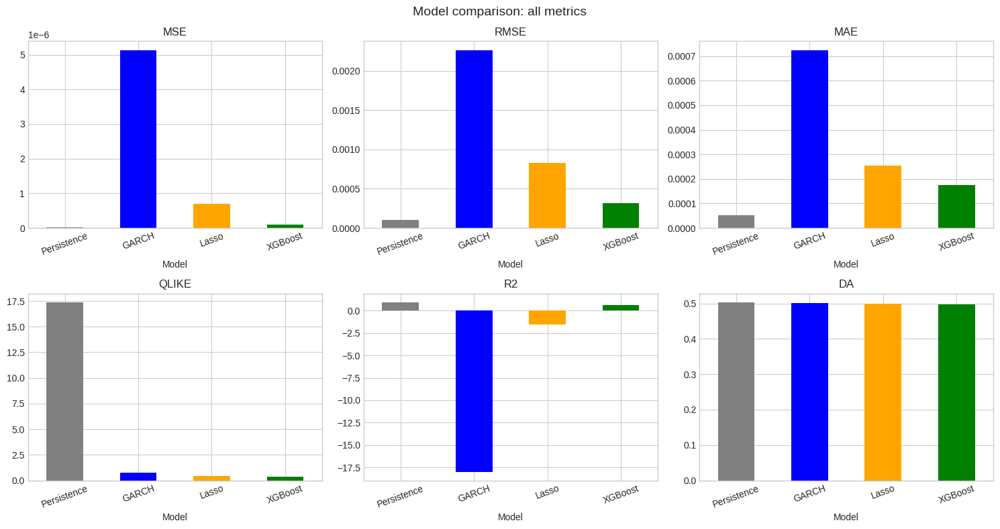

In [43]:
# metrics bar chart across models
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
colors = ["gray", "blue", "orange", "green"]
for i, metric in enumerate(metrics_df.columns):
    ax = axes.flatten()[i]
    metrics_df[metric].plot(kind="bar", ax=ax, color=colors)
    ax.set_title(metric); ax.tick_params(axis="x", rotation=20)
fig.suptitle("Model comparison: all metrics", fontsize=14)
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "18_metrics_bar.png", dpi=150); plt.show()

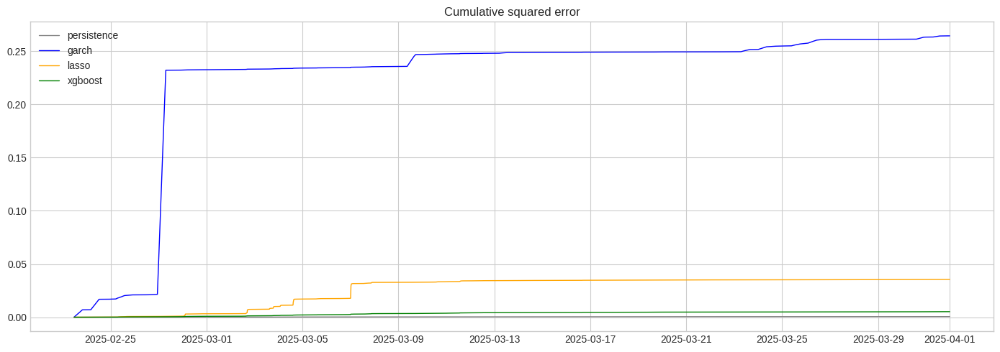

In [44]:
# cumulative squared error - who degrades over the test window?
fig, ax = plt.subplots(figsize=(14, 5))
for col, c in [("persistence", "gray"), ("garch", "blue"), ("lasso", "orange"), ("xgboost", "green")]:
    ax.plot(pred_df.index, ((pred_df["actual"] - pred_df[col])**2).cumsum(),
            color=c, linewidth=1, label=col)
ax.set_title("Cumulative squared error"); ax.legend()
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "19_cumulative_error.png", dpi=150); plt.show()

**Summary of ANalysis:**

Persistence performs extremely well on simple point-error metrics: it has the lowest MSE (`1.12e-08`), RMSE (`0.000106`), MAE (`0.000053`), and the highest R² (`0.958`). This happens because realized volatility is highly persistent and adjacent 10-minute forward RV windows overlap heavily, so the previous RV value is naturally very close to the next RV label.

However, the picture changes under QLIKE, the volatility-specific loss. Persistence has a QLIKE of `17.36`, while XGBoost has a QLIKE of only `0.373`. That means Persistence’s QLIKE is about **46.5× worse** than XGBoost’s. Lasso and GARCH also have much better QLIKE than Persistence (`0.430` and `0.762`, respectively). So although Persistence is best on average point-error metrics, it performs poorly as a variance-scale forecast.

For a quant trader, this distinction matters. MSE, RMSE, and MAE reward being close most of the time, especially during calm periods. But QLIKE is more relevant when volatility forecasts are used for risk sizing, margin, options pricing, or stop-loss calibration. A model that underestimates volatility during regime changes can lead to oversized positions or underpriced risk. Persistence is therefore a strong benchmark, but it is reactive: it mostly assumes the recent volatility level will continue. **Using persistence alone can be very dangerous because the cost of underestimating volatility during a spike is much larger than being slightly wrong during calm periods.**

### Interactive Plotly overlay

The matplotlib chart above is static. Plotly lets us zoom into specific test-window regions and hover over individual minutes to inspect predictions — useful for diagnosing where each model fails.

In [46]:
# plotly interactive overlay
fig = go.Figure()
fig.add_trace(go.Scatter(x=pred_df.index, y=pred_df["actual"],
                          name="Actual", line=dict(color="black", width=1)))
fig.add_trace(go.Scatter(x=pred_df.index, y=pred_df["garch"],
                          name="GARCH",   line=dict(color="blue",   width=1)))
fig.add_trace(go.Scatter(x=pred_df.index, y=pred_df["lasso"],
                          name="Lasso",   line=dict(color="orange", width=1)))
fig.add_trace(go.Scatter(x=pred_df.index, y=pred_df["xgboost"],
                          name="XGBoost", line=dict(color="green",  width=1)))
fig.update_layout(title="Predictions on test window (interactive)",
                  xaxis_title="Time", yaxis_title="Realized volatility",
                  hovermode="x unified", height=500)
fig.show()

## 14. Hypothesis Testing — Moving Block Bootstrap

A single-point MSE comparison could easily be luck on this particular test window. To tell whether one model truly beats another, we use the **Moving Block Bootstrap** on the squared-error differences:

1. Compute $d_t = e_{A,t}^2 - e_{B,t}^2$ for models A and B.
2. Resample 1000 times with block length 50 (preserves autocorrelation).
3. 95% CI = 2.5th / 97.5th percentiles of bootstrap means.
4. p-value = fraction of bootstrap means ≤ 0.
5. Reject $H_0$: $MSE_A \le MSE_B$ iff p < 0.05 and 0 lies outside the CI.

We run three pairwise tests. Each test's H0 is clearly labeled; sign convention is `d = err_A² − err_B²` so a positive observed Δ means B is better than A.

In [48]:
from arch.bootstrap import MovingBlockBootstrap

def block_bootstrap(err_a, err_b, block=50, reps=1000, alpha=0.05, seed=SEED):
    d = err_a**2 - err_b**2
    obs = float(np.mean(d))
    rng = np.random.RandomState(seed)
    bs = MovingBlockBootstrap(block, d, seed=rng)
    dist = np.array([
    float(np.mean(pos_data[0]))
    for pos_data, kw_data in bs.bootstrap(reps)
    ])
    ci_lo, ci_hi = np.percentile(dist, [100*alpha/2, 100*(1 - alpha/2)])
    p = float(np.mean(dist <= 0))
    return dict(delta=obs, ci_lo=float(ci_lo), ci_hi=float(ci_hi),
                p_value=p, reject=p < alpha, dist=dist)

actual_arr = pred_df["actual"].values
err = {col: (actual_arr - pred_df[col].values)
       for col in ["persistence", "garch", "lasso", "xgboost"]}

pairs = [
    ("persistence", "lasso", "H0: Lasso is no better than Persistence"),
    ("lasso", "xgboost", "H0: XGBoost is no better than Lasso"),
    ("garch", "xgboost", "H0: XGBoost is no better than GARCH"),
]

rows = []
dists = {}
for a, b, label in pairs:
    r = block_bootstrap(err[a], err[b])
    dists[(a, b)] = r["dist"]
    rows.append({
        "A": a, "B": b, "H0": label,
        "Δ MSE (err_A² − err_B²)": r["delta"],
        "CI 2.5%":  r["ci_lo"],
        "CI 97.5%": r["ci_hi"],
        "p-value":  r["p_value"],
        "Reject H0": r["reject"],
    })
boot_df = pd.DataFrame(rows)
boot_df.to_csv(OUTPUT_TABLES / "bootstrap_tests.csv", index=False)
boot_df

,A,B,H0,Δ MSE (err_A² − err_B²),CI 2.5%,CI 97.5%,p-value,Reject H0
0,persistence,lasso,H0: Lasso is no better than Persistence,-6.776459e-07,-1.301199e-06,-2.890724e-07,1.0,False
1,lasso,xgboost,H0: XGBoost is no better than Lasso,5.877347e-07,2.117640e-07,1.199017e-06,0.0,True
2,garch,xgboost,H0: XGBoost is no better than GARCH,5.032711e-06,2.611505e-06,7.719592e-06,0.0,True


/tmp/ipykernel_1580/440045446.py:10: UserWarning:

Glyph 8658 (\N{RIGHTWARDS DOUBLE ARROW}) missing from font(s) Liberation Sans.

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 8658 (\N{RIGHTWARDS DOUBLE ARROW}) missing from font(s) Liberation Sans.



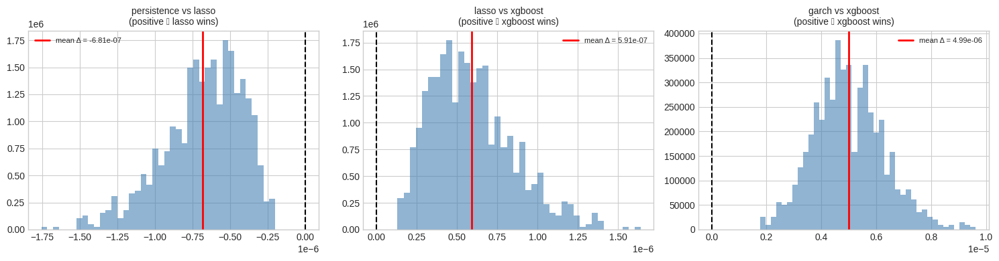

In [49]:
# bootstrap distributions side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, (a, b, label) in zip(axes, pairs):
    dist = dists[(a, b)]
    ax.hist(dist, bins=40, alpha=0.6, color="steelblue", density=True)
    ax.axvline(dist.mean(), color="red", linewidth=2, label=f"mean Δ = {dist.mean():.2e}")
    ax.axvline(0, color="black", linestyle="--")
    ax.set_title(f"{a} vs {b}\n(positive ⇒ {b} wins)", fontsize=10)
    ax.legend(fontsize=8)
plt.tight_layout(); plt.savefig(OUTPUT_FIGURES / "20_bootstrap.png", dpi=150); plt.show()

**Analysis:**

The moving block bootstrap confirms that the MSE rankings are not just artifacts of one test window. Because we define Δ MSE as `err_A² − err_B²`, a positive value means model B has lower squared error than model A.

For Persistence vs. Lasso, Δ MSE is negative (`-6.78e-07`) and the 95% confidence interval is entirely below zero. This means Lasso does not beat Persistence on MSE; Persistence remains the strongest point-error benchmark.

For Lasso vs. XGBoost, Δ MSE is positive (`5.88e-07`) with a 95% confidence interval entirely above zero, so we reject the null that XGBoost is no better than Lasso. XGBoost has a statistically stable MSE improvement over Lasso.

For GARCH vs. XGBoost, Δ MSE is also positive (`5.03e-06`) and the confidence interval is entirely above zero, so XGBoost also significantly improves over GARCH on MSE.

Overall, the bootstrap supports the same conclusion as the metrics table: Persistence is extremely hard to beat on point-error metrics, but among the learned models, XGBoost is the strongest and its improvement over Lasso and GARCH is statistically robust.

## 15. Store Predictions in DuckDB + JOIN Demo

With all four models done, we push predictions back into the `predictions` table and use a SQL JOIN to compute per-timestamp squared errors across models side by side.

In [50]:
for name, preds in [("persistence", persistence_preds),
                    ("garch",       garch_preds),
                    ("lasso",       lasso_preds),
                    ("xgboost",     xgb_preds)]:
    out = pred_df[["actual"]].rename(columns={"actual": "actual_vol"}).copy()
    out["predicted_vol"] = preds.loc[pred_df.index]
    out["model_name"] = name
    out = out.reset_index().rename(columns={"index": "timestamp"})
    conn.execute(f"DELETE FROM predictions WHERE model_name = '{name}'")
    conn.execute("INSERT INTO predictions (timestamp, model_name, predicted_vol, actual_vol) "
                 "SELECT timestamp, model_name, predicted_vol, actual_vol FROM out")
print("rows in predictions:", conn.execute("SELECT COUNT(*) FROM predictions").fetchone()[0])

rows in predictions: 206080


In [51]:
joined = conn.execute("""
    SELECT p.timestamp, p.actual_vol,
           p.predicted_vol AS persistence_pred,
           g.predicted_vol AS garch_pred,
           l.predicted_vol AS lasso_pred,
           x.predicted_vol AS xgb_pred,
           POWER(p.actual_vol - p.predicted_vol, 2) AS persistence_se,
           POWER(g.actual_vol - g.predicted_vol, 2) AS garch_se,
           POWER(l.actual_vol - l.predicted_vol, 2) AS lasso_se,
           POWER(x.actual_vol - x.predicted_vol, 2) AS xgb_se
    FROM predictions p
    JOIN predictions g ON p.timestamp = g.timestamp AND g.model_name = 'garch'
    JOIN predictions l ON p.timestamp = l.timestamp AND l.model_name = 'lasso'
    JOIN predictions x ON p.timestamp = x.timestamp AND x.model_name = 'xgboost'
    WHERE p.model_name = 'persistence'
    ORDER BY p.timestamp
    LIMIT 10
""").fetchdf()
joined

,timestamp,actual_vol,persistence_pred,garch_pred,lasso_pred,xgb_pred,persistence_se,garch_se,lasso_se,xgb_se
0,2025-02-23 11:25:00+00:00,0.000095,0.000092,0.003975,0.000264,0.000177,6.614325e-12,0.000015,2.856309e-08,6.707435e-09
1,2025-02-23 11:26:00+00:00,0.000089,0.000095,0.003975,0.000258,0.000174,3.922048e-11,0.000015,2.881323e-08,7.275292e-09
2,2025-02-23 11:27:00+00:00,0.000089,0.000089,0.003975,0.000266,0.000174,0.000000e+00,0.000015,3.154410e-08,7.256768e-09
3,2025-02-23 11:28:00+00:00,0.000091,0.000089,0.003975,0.000285,0.000174,5.196595e-12,0.000015,3.745191e-08,6.820087e-09
4,2025-02-23 11:29:00+00:00,0.000091,0.000091,0.003975,0.000267,0.000169,9.364535e-14,0.000015,3.098343e-08,6.155826e-09
5,2025-02-23 11:30:00+00:00,0.000165,0.000091,0.003975,0.000257,0.000168,5.514278e-09,0.000015,8.516576e-09,7.830147e-12
6,2025-02-23 11:31:00+00:00,0.000180,0.000165,0.003975,0.000309,0.000171,2.124236e-10,0.000014,1.680647e-08,7.247821e-11
7,2025-02-23 11:32:00+00:00,0.000181,0.000180,0.003975,0.000279,0.000173,3.685034e-12,0.000014,9.434150e-09,7.595320e-11
8,2025-02-23 11:33:00+00:00,0.000184,0.000181,0.003975,0.000277,0.000179,8.083314e-12,0.000014,8.564688e-09,3.207571e-11
9,2025-02-23 11:34:00+00:00,0.000180,0.000184,0.003975,0.000274,0.000170,1.430963e-11,0.000014,8.742334e-09,1.063040e-10


In [52]:
conn.close()

## 16. Conclusion and Discussion

This project built an end-to-end BTC/USDT short-term volatility forecasting pipeline using one year of 1-minute Binance candles from 2024-04-01 to 2025-03-31. After cleaning timestamp precision issues and validating numeric fields, the final dataset contained 525,600 minute-level rows. We then engineered 52 lookahead-safe quantitative features from the raw candle data, including return lags, rolling return statistics, Parkinson and Garman-Klass volatility, ATR, Bollinger width, volume ratios, OBV, taker-buy ratio, and cyclical hour-of-day features. Every predictive feature was shifted by one minute to avoid lookahead bias.

The EDA showed why volatility forecasting is different from price-direction forecasting. Raw returns had almost zero mean but very heavy tails, with return kurtosis around 46.9 and 1,666 observations with `|z| > 5`, compared with only about 0.3 expected under a Normal distribution. The ACF plots also showed that raw returns have little autocorrelation, but squared returns and realized volatility are persistent. This supports the main modeling setup: instead of predicting price direction, we predict the next 10-minute realized volatility.

Across the final test window, the results were mixed in an important way. Persistence was the strongest model on simple point-error metrics. It had the lowest MSE (`1.12e-08`), RMSE (`0.000106`), MAE (`0.000053`), and the highest R² (`0.958`). This makes sense because realized volatility is highly persistent and our 10-minute forward RV target is computed every minute, so adjacent target windows overlap heavily. In calm periods, simply using the previous realized volatility is very hard to beat.

However, persistence was not the best model under QLIKE, the volatility-specific loss. Persistence had a QLIKE of `17.36`, while XGBoost had a QLIKE of only `0.373`. That means Persistence’s QLIKE was about 46.5 times worse than XGBoost’s. Lasso and GARCH also had much better QLIKE than Persistence, with values of `0.430` and `0.762`. This is important because QLIKE evaluates the quality of the variance-scale forecast, not just average pointwise closeness. For a quant trader, this matters because the cost of getting volatility wrong is asymmetric. Being slightly wrong during calm periods is usually not disastrous, but underestimating volatility during a spike can lead to oversized positions, underpriced risk, margin problems, or stop-loss levels that are too tight.

For this reason, Persistence is a strong benchmark but not necessarily the best deployable trading-risk model. It is reactive: it mostly assumes the next volatility level will look like the recent volatility level. That works well when volatility stays calm, but it can lag when regimes change. XGBoost is a good candidate because it uses more market information than Persistence, including recent trading range, rolling volatility, volume, time-of-day, and order-flow proxy features. Among the learned models, XGBoost had the best MSE (`1.01e-07`), RMSE (`0.000318`), MAE (`0.000174`), QLIKE (`0.373`), and R² (`0.626`). The moving block bootstrap also showed that XGBoost’s MSE improvement over Lasso and GARCH was statistically stable, while Lasso did not beat Persistence on MSE.

The feature-importance results also support the modeling story. Lasso selected 24 out of 52 features, with top coefficients including `ret_std_60`, `parkinson_5`, `ret_std_30`, `bollinger_width`, `atr`, and `volume_ratio_60`. XGBoost also ranked range-based volatility features highly, especially `parkinson_30`, `parkinson_10`, `garman_klass_10`, and `parkinson_60`. This agreement suggests that the useful signals are not random: near-future BTC volatility is mainly explained by recent volatility level, intraminute high-low range, trading activity, and market regime context.

A useful future improvement would be to combine Persistence and XGBoost instead of choosing only one. Persistence is very strong during calm, stable periods because it tracks the recent RV level closely. XGBoost is more attractive when the market is changing because it uses additional signals and has much better QLIKE. A simple hybrid model could take a weighted average of the two forecasts:

`hybrid_pred = w * xgboost_pred + (1 - w) * persistence_pred`

The weight `w` could be tuned on the validation set. A more adaptive version could increase the XGBoost weight when volume, range-based volatility, or rolling return standard deviation is unusually high, and rely more on Persistence during calm periods. This would try to get the best of both: Persistence’s low average error in quiet markets and XGBoost’s better variance-scale behavior during volatility regime changes.

There are several limitations. First, because the 10-minute RV target is computed every minute, adjacent labels overlap, which makes Persistence unusually strong. A future robustness check should evaluate on non-overlapping 10-minute timestamps. Second, GARCH required a numerical-stability filter because a small number of rolling refits produced implausible forecast explosions; this is a model-output issue rather than a data issue, but it shows that classical volatility models can be fragile in high-frequency crypto data. Third, the project only uses BTC/USDT candles, so future work could add order-book depth, funding rates, liquidation data, macro/news indicators, or test the same pipeline on other coins. Finally, the reduced 24-feature XGBoost experiment only increased validation MSE by 1.03%, so a simpler reduced-feature model may be worth testing more seriously for deployment.

Overall, the main conclusion is that Persistence is the best simple benchmark for average point-error, **but XGBoost is the strongest learned volatility-risk model.** For a quant trader, this distinction is important: if the goal is only to minimize average RMSE in calm periods, Persistence is hard to beat. But if the forecast is used for risk sizing, margin, stop-losses, or options-related decisions, then volatility-spike behavior matters more, and XGBoost’s much lower QLIKE makes it a better model to consider.